In [4]:
import os
import pandas as pd
import numpy as np
import sys
import re
import json

import math
from collections import defaultdict, Counter
import csv
import time
from datetime import date, datetime

print(date.today())
print('Python version:', sys.version)
print('\nWorking directory:', os.getcwd())
os.chdir(r'C:\Users\Denis_Davydov2\OneDrive - EPAM\Prophet_AI_docs\Datasets\AI_skills\Topics')
print('\nCurrent working directory:', os.getcwd())

2025-11-10
Python version: 3.13.5 | packaged by Anaconda, Inc. | (main, Jun 12 2025, 16:37:03) [MSC v.1929 64 bit (AMD64)]

Working directory: c:\Users\Denis_Davydov2\OneDrive\Scipts\Py_Scripts\EPAM\Prophet\AI_skills

Current working directory: C:\Users\Denis_Davydov2\OneDrive - EPAM\Prophet_AI_docs\Datasets\AI_skills\Topics


# Get and normalize embedding data

In [38]:
# Load topics embeddings
file_path = 'C:\\Users\\Denis_Davydov2\\OneDrive - EPAM\\Prophet_AI_docs\\Datasets\\AI_skills\\Topics\\'
file_name = 'topic_embeddings_2025-11-09.csv'

topics_all = pd.read_csv(file_path+file_name)
print("File read: ", file_name)

# delete row with term 'c'
topics_all = topics_all[topics_all['term']!='c']

topics_all

File read:  topic_embeddings_2025-11-09.csv


,id,term,definition,count,embedding
0,6.0,1-bit inference,1-bit inference refers to the process of runni...,2.0,"[0.013369596563279629, -0.013582167215645313, ..."
1,7.0,1-bit llm,A 1-bit large language model (LLM) is a highly...,5.0,"[0.017574984580278397, -0.004011554177850485, ..."
2,9.0,1-bit quantization,1-bit quantization is an extreme model compres...,6.0,"[-0.01522609032690525, 0.0012089558877050877, ..."
3,14.0,2-bit quantization,2-bit quantization is a process that reduces t...,4.0,"[-0.006645898800343275, 0.006167215760797262, ..."
4,17.0,2d animation,"""2D animation"" refers to the use of artificial...",3.0,"[0.008917991071939468, -0.002153154695406556, ..."
...,...,...,...,...,...
7361,19003.0,zero-shot voice cloning,Zero-shot voice cloning is the task of synthes...,3.0,"[-0.007965236902236938, -0.027662580832839012,..."
7362,19007.0,zero-trust security,Zero-trust security for AI/ML is an architectu...,4.0,"[-0.01758248545229435, 0.059987302869558334, 0..."
7363,19010.0,zero/zero++,"""Zero"" (zero-shot) refers to applying or evalu...",2.0,"[-0.0007028839900158346, 0.011448170058429241,..."
7364,19012.0,zerogpu,"Zerogpu (often stylized ""zerogpu"") refers to C...",2.0,"[0.004047493916004896, 0.05906970053911209, 0...."


In [39]:
# Proper embedding parsing + L2 normalization (emb_norm)
topics =topics_all.copy()
if 'embedding' not in topics.columns:
    raise ValueError("Column 'embedding' not found in topics DataFrame.")

raw_emb = topics['embedding']
parsed = []
for i, v in enumerate(raw_emb):
    if isinstance(v, (list, tuple)):
        arr = list(v)
    elif isinstance(v, str):
        v_str = v.strip()
        if not v_str:
            arr = []
        else:
            try:
                arr = json.loads(v_str)
            except json.JSONDecodeError:
                # Attempt to parse as bracket-less comma-separated numbers
                try:
                    arr = [float(x) for x in v_str.split(',')]
                except Exception:
                    arr = []
    else:
        arr = []
    parsed.append(arr)

lengths = [len(p) for p in parsed if p]
if not lengths:
    raise RuntimeError("No non-empty embeddings parsed.")
main_dim = max(set(lengths), key=lengths.count)

# Pad or zero-replace inconsistent vectors
clean_vecs = []
for p in parsed:
    if len(p) == main_dim:
        clean_vecs.append(p)
    else:
        clean_vecs.append([0.0]*main_dim)

X = np.asarray(clean_vecs, dtype=np.float32)
print(f"Parsed embedding matrix shape: {X.shape}")

# L2 normalization
norms = np.linalg.norm(X, axis=1, keepdims=True)
norms[norms == 0] = 1.0
emb_norm = X / norms
print(f"L2-normalized matrix shape: {emb_norm.shape}; dim={emb_norm.shape[1]}")

# store normalized embeddings back as JSON strings
topics1 = topics.copy()
topics1['embedding_norm'] = [json.dumps(row.tolist()) for row in emb_norm]
print("Added 'embedding_norm' column with normalized vectors.")

topics1

Parsed embedding matrix shape: (7365, 1536)
L2-normalized matrix shape: (7365, 1536); dim=1536
Added 'embedding_norm' column with normalized vectors.


,id,term,definition,count,embedding,embedding_norm
0,6.0,1-bit inference,1-bit inference refers to the process of runni...,2.0,"[0.013369596563279629, -0.013582167215645313, ...","[0.013369597494602203, -0.013582168146967888, ..."
1,7.0,1-bit llm,A 1-bit large language model (LLM) is a highly...,5.0,"[0.017574984580278397, -0.004011554177850485, ...","[0.017574984580278397, -0.004011554177850485, ..."
2,9.0,1-bit quantization,1-bit quantization is an extreme model compres...,6.0,"[-0.01522609032690525, 0.0012089558877050877, ...","[-0.015226091258227825, 0.0012089560041204095,..."
3,14.0,2-bit quantization,2-bit quantization is a process that reduces t...,4.0,"[-0.006645898800343275, 0.006167215760797262, ...","[-0.006645898800343275, 0.006167215760797262, ..."
4,17.0,2d animation,"""2D animation"" refers to the use of artificial...",3.0,"[0.008917991071939468, -0.002153154695406556, ...","[0.008917991071939468, -0.002153154695406556, ..."
...,...,...,...,...,...,...
7361,19003.0,zero-shot voice cloning,Zero-shot voice cloning is the task of synthes...,3.0,"[-0.007965236902236938, -0.027662580832839012,...","[-0.007965235970914364, -0.027662577107548714,..."
7362,19007.0,zero-trust security,Zero-trust security for AI/ML is an architectu...,4.0,"[-0.01758248545229435, 0.059987302869558334, 0...","[-0.01758248545229435, 0.059987302869558334, 0..."
7363,19010.0,zero/zero++,"""Zero"" (zero-shot) refers to applying or evalu...",2.0,"[-0.0007028839900158346, 0.011448170058429241,...","[-0.0007028839900158346, 0.011448170058429241,..."
7364,19012.0,zerogpu,"Zerogpu (often stylized ""zerogpu"") refers to C...",2.0,"[0.004047493916004896, 0.05906970053911209, 0....","[0.004047493916004896, 0.05906970053911209, 0...."


## Checking the embedding correctness 

In [25]:
# 1) Check specific topics before normalization
pd.set_option('display.max_colwidth', 200)
display(topics[topics['id'].isin([7,100,7400])])
pd.reset_option('display.max_colwidth')

,id,term,definition,count,embedding
1,7.0,1-bit llm,"A 1-bit large language model (LLM) is a highly quantized neural network where each parameter, or weight, is represented by a single bit of information, typically as values like +1 and -1. This ext...",5.0,"[0.017574984580278397, -0.004011554177850485, 0.004635897930711508, -0.03615358844399452, -0.01414401177316904, -0.038931041955947876, 0.004428755957633257, 0.011909211054444313, -0.03648034483194..."
2850,7400.0,generative music,"Generative music, in the context of AI, refers to music autonomously composed or created by algorithms and machine learning models. These systems learn patterns from existing musical data to produ...",2.0,"[0.0032971512991935015, -0.029308011755347252, 0.036073096096515656, -0.019127333536744118, 0.02232256904244423, -0.06994257867336273, 0.014433644711971283, -0.009409414604306221, 0.00039114075480..."


In [13]:
# 2) Check specific topics after normalization
pd.set_option('display.max_colwidth', 200)
display(topics1[topics1['id'].isin([7,100,7400])])
pd.reset_option('display.max_colwidth')

,id,term,definition,embedding,count,embedding_norm
1,7.0,1-bit llm,"A 1-bit large language model (LLM) is a highly quantized neural network where each parameter, or weight, is represented by a single bit of information, typically as values like +1 and -1. This ext...","[0.017574984580278397, -0.004011554177850485, 0.004635897930711508, -0.03615358844399452, -0.01414401177316904, -0.038931041955947876, 0.004428755957633257, 0.011909211054444313, -0.03648034483194...",5.0,"[0.017574984580278397, -0.004011554177850485, 0.004635897930711508, -0.03615358844399452, -0.01414401177316904, -0.038931041955947876, 0.004428755957633257, 0.011909211054444313, -0.03648034483194..."
2857,7400.0,generative music,"Generative music, in the context of AI, refers to music autonomously composed or created by algorithms and machine learning models. These systems learn patterns from existing musical data to produ...","[0.0032971512991935015, -0.029308011755347252, 0.036073096096515656, -0.019127333536744118, 0.02232256904244423, -0.06994257867336273, 0.014433644711971283, -0.009409414604306221, 0.00039114075480...",2.0,"[0.0032971512991935015, -0.029308011755347252, 0.036073096096515656, -0.019127333536744118, 0.02232256904244423, -0.06994257867336273, 0.014433644711971283, -0.009409414604306221, 0.00039114075480..."


In [15]:
# Filter rows where 'term' column contains 'prompt' (case-insensitive)
prompt_rows = topics1[topics1['term'].str.contains('claude 3.5', case=False, na=False)]
prompt_rows

,id,term,definition,embedding,count,embedding_norm
753,1931.0,anthropic claude 3.5,Anthropic's Claude 3.5 Sonnet is the first and...,"[-0.004543873481452465, 0.014140748418867588, ...",3.0,"[-0.004543873947113752, 0.014140749350190163, ..."
1352,3549.0,claude 3.5,Claude 3.5 is the latest generation of AI mode...,"[0.0022632817272096872, 0.0123297655954957, 0....",5.0,"[0.0022632817272096872, 0.0123297655954957, 0...."


In [40]:


# Locate target term (case-insensitive exact match)
mask_exact = topics1['term'].str.lower() == 'artificial intelligence'.lower()
if not mask_exact.any():
    raise ValueError("Term not found. Check spelling or ensure preprocessing removed prefixes correctly.")

# Use the first matching row (if duplicates exist)
target_idx = mask_exact[mask_exact].index[0]
raw_vec = topics1.loc[target_idx, 'embedding_norm']
try:
    target_vec = np.array(json.loads(raw_vec), dtype=np.float32)
except json.JSONDecodeError:
    target_vec = np.array([float(x) for x in raw_vec.split(',')], dtype=np.float32)

# Parse all embeddings
emb_list = []
for v in topics1['embedding_norm']:
    if isinstance(v, str) and v.strip():
        try:
            arr = json.loads(v)
        except json.JSONDecodeError:
            try:
                arr = [float(x) for x in v.split(',')]
            except Exception:
                arr = []
    elif isinstance(v, (list, tuple, np.ndarray)):
        arr = list(v)
    else:
        arr = []
    emb_list.append(arr)

lengths = [len(a) for a in emb_list if a]
if not lengths:
    raise RuntimeError("No embeddings parsed from 'embedding_norm'.")
main_dim = max(set(lengths), key=lengths.count)
X = np.array([a if len(a)==main_dim else [0.0]*main_dim for a in emb_list], dtype=np.float32)

# Ensure L2 normalization (embedding_norm should already be normalized)
norms = np.linalg.norm(X, axis=1, keepdims=True)
norms[norms==0] = 1.0
X = X / norms
# Renormalize target too
nv = np.linalg.norm(target_vec)
if nv == 0:
    raise ValueError("Target embedding vector is zero norm; cannot compute similarities.")
target_vec = target_vec / nv

# Cosine similarities via dot product (since normalized)
sims = X @ target_vec  # shape (n,)

# Build results DataFrame
res_df = pd.DataFrame({
    'id': topics1['id'] if 'id' in topics1.columns else np.arange(len(topics1)),
    'term': topics1['term'],
    'similarity': sims,
    'definition': topics1['definition']
})

# Exclude the target term itself
#res_df = res_df[res_df.index != target_idx]


sim_df = res_df.sort_values('similarity', ascending=False).reset_index(drop=True)
sim_df.head(30)


,id,term,similarity,definition
0,2151.0,artificial intelligence,1.000000,Artificial intelligence (AI) is the theory and...
1,1331.0,ai theory,0.799676,AI theory refers to the foundational principle...
2,1324.0,ai technology,0.791088,AI technology is a field of computer science t...
3,800.0,ai development,0.776263,AI development is the process of creating inte...
4,608.0,agi (artificial general intelligence),0.742036,Artificial General Intelligence (AGI) is a the...
5,1202.0,ai research,0.738704,AI research is the scientific field that explo...
6,1165.0,ai programming,0.732620,"AI programming is the development of software,..."
7,2149.0,artificial general intelligence (agi),0.731139,Artificial general intelligence (AGI) is a the...
8,15093.0,robotics ai,0.729583,Robotics AI is the integration of artificial i...
9,677.0,ai application development,0.729357,AI application development is the process of b...


# Target topic selectiom

## Similarity to "aI"

In [41]:
# Get target 'AI development' embedding
file_path = 'C:\\Users\\Denis_Davydov2\\OneDrive - EPAM\\Prophet_AI_docs\\Datasets\\AI_skills\\Topics\\'
file_name = 'target_AI_vector.txt'

with open(file_path + file_name, 'r', encoding='utf-8') as f:
    ai_embedding = json.load(f)

ai_target_vec = np.array(ai_embedding, dtype=np.float32)
print(f"Loaded AI target embedding vector, dimension: {len(ai_target_vec)}")
print(f"Vector norm: {np.linalg.norm(ai_target_vec):.4f}")



# L2 normalize the AI target vector
norm = np.linalg.norm(ai_target_vec)
if norm == 0:
    raise ValueError("Target vector has zero norm, cannot normalize")

ai_target_vec_norm = ai_target_vec / norm
print("\nNormalized AI target vector.")
print(f"Original norm: {norm:.4f}")
print(f"Normalized norm: {np.linalg.norm(ai_target_vec_norm):.4f}")
print(f"Vector dimension: {len(ai_target_vec_norm)}")

ai_target_vec_norm

Loaded AI target embedding vector, dimension: 1536
Vector norm: 1.0000

Normalized AI target vector.
Original norm: 1.0000
Normalized norm: 1.0000
Vector dimension: 1536


array([-0.00029644, -0.00554628,  0.05506532, ...,  0.01174059,
       -0.03997028,  0.01444158], shape=(1536,), dtype=float32)

In [42]:
# Calculate cosine similarities between AI target vector and all topics
# Parse all embeddings from topics1['embedding_norm']
emb_list = []
for v in topics1['embedding_norm']:
    if isinstance(v, str) and v.strip():
        try:
            arr = json.loads(v)
        except json.JSONDecodeError:
            try:
                arr = [float(x) for x in v.split(',')]
            except Exception:
                arr = []
    elif isinstance(v, (list, tuple, np.ndarray)):
        arr = list(v)
    else:
        arr = []
    emb_list.append(arr)

# Validate dimensions
lengths = [len(a) for a in emb_list if a]
if not lengths:
    raise RuntimeError("No embeddings parsed from 'embedding_norm'.")
main_dim = max(set(lengths), key=lengths.count)

# Create matrix with proper dimensions
X_topics = np.array([a if len(a)==main_dim else [0.0]*main_dim for a in emb_list], dtype=np.float32)

# Ensure L2 normalization (should already be normalized, but verify)
norms = np.linalg.norm(X_topics, axis=1, keepdims=True)
norms[norms==0] = 1.0
X_topics_norm = X_topics / norms

print("----- Cosine similarities between AI target vector and all topics------")
print(f"Embedding matrix shape: {X_topics_norm.shape}")
print(f"AI target vector shape: {ai_target_vec_norm.shape}")

# Calculate cosine similarities (dot product since both are normalized)
similarities = X_topics_norm @ ai_target_vec_norm

# Add similarity column to topics1
topics1['similarity_to_AI'] = similarities
print(f"Added 'similarity_to_AI' column to topics1 DataFrame")

# Create results DataFrame sorted by similarity
ai_similarity_df = pd.DataFrame({
    'id': topics1['id'],
    'term': topics1['term'],
    'definition': topics1['definition'],
    'similarity_to_AI': similarities
})

# Sort by similarity (descending)
ai_similarity_df = ai_similarity_df.sort_values('similarity_to_AI', ascending=False).reset_index(drop=True)

print(f"\nTop 20 terms most similar to AI target:")
ai_similarity_df.head(20)

----- Cosine similarities between AI target vector and all topics------
Embedding matrix shape: (7365, 1536)
AI target vector shape: (1536,)
Added 'similarity_to_AI' column to topics1 DataFrame

Top 20 terms most similar to AI target:


,id,term,definition,similarity_to_AI
0,1312.0,ai system development,AI system development is the process of design...,0.741273
1,955.0,ai implementation,AI implementation is the systematic integratio...,0.738081
2,800.0,ai development,AI development is the process of creating inte...,0.726142
3,796.0,ai deployment,AI deployment is the process of integrating a ...,0.719041
4,1310.0,ai system deployment,AI system deployment is the process of taking ...,0.715060
5,677.0,ai application development,AI application development is the process of b...,0.711345
6,1056.0,ai model development,AI model development is the process of creatin...,0.705457
7,1168.0,ai projects,An AI project is the process of applying artif...,0.703109
8,1027.0,ai lifecycle management,AI lifecycle management is the process of over...,0.702966
9,1136.0,ai platform development,AI platform development involves creating an i...,0.695773


In [11]:
topics1

,id,term,definition,count,embedding,embedding_norm,similarity_to_AI
0,6.0,1-bit inference,1-bit inference refers to the process of runni...,2.0,"[0.013369596563279629, -0.013582167215645313, ...","[0.013369597494602203, -0.013582168146967888, ...",0.280766
1,7.0,1-bit llm,A 1-bit large language model (LLM) is a highly...,5.0,"[0.017574984580278397, -0.004011554177850485, ...","[0.017574984580278397, -0.004011554177850485, ...",0.220254
2,9.0,1-bit quantization,1-bit quantization is an extreme model compres...,6.0,"[-0.01522609032690525, 0.0012089558877050877, ...","[-0.015226091258227825, 0.0012089560041204095,...",0.187808
3,14.0,2-bit quantization,2-bit quantization is a process that reduces t...,4.0,"[-0.006645898800343275, 0.006167215760797262, ...","[-0.006645898800343275, 0.006167215760797262, ...",0.190536
4,17.0,2d animation,"""2D animation"" refers to the use of artificial...",3.0,"[0.008917991071939468, -0.002153154695406556, ...","[0.008917991071939468, -0.002153154695406556, ...",0.370161
...,...,...,...,...,...,...,...
7361,19003.0,zero-shot voice cloning,Zero-shot voice cloning is the task of synthes...,3.0,"[-0.007965236902236938, -0.027662580832839012,...","[-0.007965235970914364, -0.027662577107548714,...",0.212219
7362,19007.0,zero-trust security,Zero-trust security for AI/ML is an architectu...,4.0,"[-0.01758248545229435, 0.059987302869558334, 0...","[-0.01758248545229435, 0.059987302869558334, 0...",0.419530
7363,19010.0,zero/zero++,"""Zero"" (zero-shot) refers to applying or evalu...",2.0,"[-0.0007028839900158346, 0.011448170058429241,...","[-0.0007028839900158346, 0.011448170058429241,...",0.243124
7364,19012.0,zerogpu,"Zerogpu (often stylized ""zerogpu"") refers to C...",2.0,"[0.004047493916004896, 0.05906970053911209, 0....","[0.004047493916004896, 0.05906970053911209, 0....",0.299549


In [12]:
pd.set_option('display.max_rows', None)
display(ai_similarity_df)
pd.reset_option('display.max_rows')

,id,term,definition,similarity_to_AI
0,1312.0,ai system development,AI system development is the process of design...,0.741273
1,955.0,ai implementation,AI implementation is the systematic integratio...,0.738081
2,800.0,ai development,AI development is the process of creating inte...,0.726142
3,796.0,ai deployment,AI deployment is the process of integrating a ...,0.719041
4,1310.0,ai system deployment,AI system deployment is the process of taking ...,0.715060
5,677.0,ai application development,AI application development is the process of b...,0.711345
6,1056.0,ai model development,AI model development is the process of creatin...,0.705457
7,1168.0,ai projects,An AI project is the process of applying artif...,0.703109
8,1027.0,ai lifecycle management,AI lifecycle management is the process of over...,0.702966
9,1136.0,ai platform development,AI platform development involves creating an i...,0.695773


## Central cluster

In [43]:
import numpy as np
from sklearn.preprocessing import normalize
from sklearn.mixture import GaussianMixture
from sklearn.neighbors import NearestNeighbors, LocalOutlierFactor
from sklearn.cluster import DBSCAN
from sklearn.decomposition import PCA

def l2_normalize(X, eps=1e-12):
    norms = np.linalg.norm(X, axis=1, keepdims=True)
    norms = np.maximum(norms, eps)
    return X / norms

def trimmed_centroid(X, trim_frac=0.1, max_iter=5, random_state=42, side='side'):
    """
    Iteratively estimates a robust centroid in cosine geometry (X is already L2-normalized).
    trim_frac: fraction of objects discarded at each iteration (by lowest proximity).
    Returns centroid (unit length) and final cosine proximities to it.
    """
    rng = np.random.default_rng(random_state)
    n = X.shape[0]
    # starting centroid — simple mean
    c = X.mean(axis=0)
    c = c / np.linalg.norm(c)
    mask = np.ones(n, dtype=bool)

    for _ in range(max_iter):
        sims = X @ c  # cosine proximities for normalized X
        # keep top (1-trim_frac) by proximity
        thresh = np.quantile(sims, trim_frac)
        new_mask = sims >= thresh
        if new_mask.sum() == 0 or np.all(new_mask == mask):
            break
        mask = new_mask
        c = X[mask].mean(axis=0)
        c = c / (np.linalg.norm(c) + 1e-12)

    # Final proximities (for all)
    sims = X @ c
    return c, sims

def threshold_by_mad(scores, k=3.0):
    """
    Robust cutoff by MAD: below median by k*MAD are considered outliers.
    For proximities (the smaller, the worse) this is a reasonable criterion.
    """
    med = np.median(scores)
    mad = np.median(np.abs(scores - med)) + 1e-12
    robust_z = (scores - med) / (1.4826 * mad)
    outliers = robust_z < -k
    return outliers

def threshold_by_quantile(scores, contamination=0.1):
    """
    If you know approximately the fraction of anomalies, threshold by corresponding quantile.
    """
    t = np.quantile(scores, contamination)
    return scores < t

def threshold_by_gmm(scores, random_state=42, min_sep=0.02, prob_thresh=0.5):
    """
    Automatic threshold via GMM (2 mixtures) on 1D-proximities.
    Component with higher mean proximity — "inliers".
    Assign to inliers if posterior of this component >= prob_thresh.
    """
    s = scores.reshape(-1, 1)
    gmm = GaussianMixture(n_components=2, covariance_type='full', random_state=random_state, n_init=5)
    gmm.fit(s)
    means = gmm.means_.ravel()
    inlier_comp = np.argmax(means)  # higher mean proximity
    post = gmm.predict_proba(s)[:, inlier_comp]
    # sanity-check: if mixtures are barely separated, fallback to MAD
    if abs(np.diff(sorted(means)))[0] < min_sep:
        return threshold_by_mad(scores)
    return post < (1.0 - prob_thresh)

def robust_center_filter(X, trim_frac=0.1, max_iter=5,
                         threshold='gmm', contamination=None, mad_k=3.0, random_state=42):
    """
    Returns:
      outliers_mask, scores (cosine proximity to center), center
    threshold: 'gmm' | 'mad' | 'quantile'
    """
    Xn = l2_normalize(X)
    center, sims = trimmed_centroid(Xn, trim_frac=trim_frac, max_iter=max_iter, random_state=random_state)
    if threshold == 'gmm':
        outliers = threshold_by_gmm(sims, random_state=random_state)
    elif threshold == 'mad':
        outliers = threshold_by_mad(sims, k=mad_k)
    elif threshold == 'quantile':
        if contamination is None:
            raise ValueError("contamination must be set for quantile threshold")
        outliers = threshold_by_quantile(sims, contamination=contamination)
    else:
        raise ValueError("Unknown threshold method")
    return outliers, sims, center

def lof_filter(X, n_neighbors=50, contamination=0.1, use_pca=False, pca_dim=128, random_state=42):
    """
    LOF with cosine metric. Returns mask, lof_scores (the lower, the more 'outlier').
    """
    Xn = l2_normalize(X)
    if use_pca:
        pca = PCA(n_components=pca_dim, random_state=random_state)
        Xn = pca.fit_transform(Xn)
        # after PCA cosine may be lost; but LOF is often more stable in Euclidean metric after PCA
        metric = 'euclidean'
    else:
        metric = 'cosine'
    lof = LocalOutlierFactor(n_neighbors=n_neighbors, contamination=contamination, metric=metric, novelty=False)
    y_pred = lof.fit_predict(Xn)   # -1 = outlier, 1 = inlier
    # negative_outlier_factor_: lower values => more anomalous
    scores = lof.negative_outlier_factor_
    outliers = y_pred == -1
    return outliers, scores

def dbscan_filter(X, eps=0.15, min_samples=15, use_pca=False, pca_dim=128, random_state=42):
    """
    DBSCAN with cosine metric. Returns mask_outliers and labels (where -1 = noise).
    Idea: keep only the largest cluster, the rest — outliers.
    """
    Xn = l2_normalize(X)
    metric = 'cosine'
    if use_pca:
        pca = PCA(n_components=pca_dim, random_state=random_state)
        Xn = pca.fit_transform(Xn)
        metric = 'euclidean'
    db = DBSCAN(eps=eps, min_samples=min_samples, metric=metric, n_jobs=-1)
    labels = db.fit_predict(Xn)
    # find largest cluster (excluding -1)
    unique, counts = np.unique(labels[labels != -1], return_counts=True)
    if len(unique) == 0:
        # all noise — return all as outliers
        return np.ones(X.shape[0], dtype=bool), labels
    main_cluster = unique[np.argmax(counts)]
    outliers = labels != main_cluster
    return outliers, labels

def knn_avg_similarity(X, k=50):
    """
    Average cosine proximity to k neighbors: local 'density'.
    Returns avg_sim for each object.
    """
    Xn = l2_normalize(X)
    nn = NearestNeighbors(n_neighbors=k+1, metric='cosine', n_jobs=-1)
    nn.fit(Xn)
    dists, idx = nn.kneighbors(Xn, return_distance=True)
    # dists[:, 0] = 0 (the object itself). Convert distances to similarity: sim = 1 - dist
    avg_sim = 1.0 - dists[:, 1:].mean(axis=1)
    return avg_sim

def combine_consensus(*masks, require=2):
    """
    Simple ensemble: object is an outlier if marked as outlier by >= require methods.
    """
    votes = np.stack([m.astype(int) for m in masks], axis=1)
    return (votes.sum(axis=1) >= require)


In [44]:
# X — embedding array shape (n, 1536)
work_df = topics1.copy()


# Parse embeddings JSON -> numpy array
emb_list = []
for i, e in enumerate(work_df["embedding"].tolist()):
    if isinstance(e, str) and e.strip():
        try:
            vec = json.loads(e)
        except json.JSONDecodeError:
            vec = []
    elif isinstance(e, (list, tuple)):
        vec = e
    else:
        vec = []
    emb_list.append(vec)

# Validate all non-empty and same dimensionality
dims = [len(v) for v in emb_list if v]
if not dims:
    raise RuntimeError("No embeddings parsed.")
vector_dim = Counter(dims).most_common(1)[0][0]

# Replace malformed vectors with zeros
clean_vectors = []
for v in emb_list:
    if len(v) != vector_dim:
        clean_vectors.append([0.0]*vector_dim)
    else:
        clean_vectors.append(v)

X = np.array(clean_vectors, dtype=np.float32)
print(f"Embedding matrix shape: {X.shape}")





Embedding matrix shape: (7365, 1536)


In [45]:
# Apply all outlier detection algorithms to identify main cluster membership
# Create topics_labelled with binary flags for each algorithm (1=main cluster, 0=outlier)

print(f"Running outlier detection algorithms on {len(topics1)} terms...")
print(f"Embedding matrix shape: {X.shape}\n")

# Initialize topics_labelled
topics_labelled = topics1.copy()

# ========== Algorithm 1: GMM Filter (via robust_center_filter) ==========
print("1. Running GMM filter...")
out_gmm, sims_gmm, center_gmm = robust_center_filter(X, trim_frac=0.1, max_iter=5,
                                                       threshold='gmm', random_state=42)
topics_labelled['gmm_filter'] = (~out_gmm).astype(int)  # 1 for inliers, 0 for outliers
print(f"   GMM: {(~out_gmm).sum()} inliers, {out_gmm.sum()} outliers ({out_gmm.mean()*100:.2f}% outliers)")



# ========== Algorithm 2: MAD Filter (via robust_center_filter) ==========
print("\n2. Running MAD filter...")
out_mad, sims_mad, center_mad = robust_center_filter(X, trim_frac=0.2, max_iter=15,
                                                       threshold='mad', mad_k=1.5, random_state=42)
topics_labelled['mad_filter'] = (~out_mad).astype(int)
print(f"   MAD: {(~out_mad).sum()} inliers, {out_mad.sum()} outliers ({out_mad.mean()*100:.2f}% outliers)")



# ========== Algorithm 3: Quantile Filter (via robust_center_filter) ==========
print("\n3. Running Quantile filter (10% contamination)...")
out_quantile, sims_quantile, center_quantile = robust_center_filter(X, trim_frac=0.1, max_iter=15,
                                                                      threshold='quantile', 
                                                                      contamination=0.1, random_state=42)
topics_labelled['quantile_filter'] = (~out_quantile).astype(int)
print(f"   Quantile: {(~out_quantile).sum()} inliers, {out_quantile.sum()} outliers ({out_quantile.mean()*100:.2f}% outliers)")



# ========== Algorithm 4: Trimmed Centroid (similarity scores) ==========
print("\n4. Running Trimmed Centroid (using MAD threshold on similarities)...")
Xn_temp = X / np.maximum(np.linalg.norm(X, axis=1, keepdims=True), 1e-12)
center_trimmed, sims_trimmed = trimmed_centroid(Xn_temp, trim_frac=0.2, max_iter=15, random_state=42, side="low")
out_centroid = threshold_by_mad(sims_trimmed, k=2.0)
topics_labelled['centroid_filter'] = (~out_centroid).astype(int)
print(f"   Centroid: {(~out_centroid).sum()} inliers, {out_centroid.sum()} outliers ({out_centroid.mean()*100:.2f}% outliers)")



# ========== Algorithm 5: LOF Filter ==========
print("\n5. Running LOF filter...")
out_lof, lof_scores_result = lof_filter(X, n_neighbors=30, contamination=0.15, use_pca=True, pca_dim=128)
topics_labelled['lof_filter'] = (~out_lof).astype(int)
print(f"   LOF: {(~out_lof).sum()} inliers, {out_lof.sum()} outliers ({out_lof.mean()*100:.2f}% outliers)")



# ========== Algorithm 6: DBSCAN Filter ==========
print("\n6. Running DBSCAN filter...")
out_dbscan, labels_dbscan = dbscan_filter(X, eps=0.65, min_samples=100, use_pca=True, pca_dim=64)
topics_labelled['dbscan_filter'] = (~out_dbscan).astype(int)
print(f"   DBSCAN: {(~out_dbscan).sum()} inliers, {out_dbscan.sum()} outliers ({out_dbscan.mean()*100:.2f}% outliers)")




# ==================== Consensus Analysis ====================
print("\n" + "="*60)
print("CONSENSUS ANALYSIS")
print("="*60)

# Calculate how many algorithms agree each term is in main cluster
filter_columns = ['gmm_filter', 'mad_filter', 'quantile_filter', 'centroid_filter', 'lof_filter', 'dbscan_filter']
topics_labelled['consensus_score'] = topics_labelled[filter_columns].sum(axis=1)

# Majority vote (4+ algorithms agree it's in main cluster)
topics_labelled['consensus_majority'] = (topics_labelled['consensus_score'] >= 4).astype(int)

# Strict consensus (all 6 algorithms agree)
topics_labelled['consensus_strict'] = (topics_labelled['consensus_score'] == 6).astype(int)

print(f"\nConsensus Score Distribution:")
print(topics_labelled['consensus_score'].value_counts().sort_index())

print(f"\nMajority Consensus (4+ algorithms): {topics_labelled['consensus_majority'].sum()} inliers")
print(f"Strict Consensus (all 6 algorithms): {topics_labelled['consensus_strict'].sum()} inliers")

print("\n" + "="*60)
print("SUMMARY: Columns added to topics_labelled")
print("="*60)
print("Individual algorithms (1=main cluster, 0=outlier):")
for col in filter_columns:
    print(f"  - {col}")
print("\nConsensus columns:")
print("  - consensus_score (0-6): number of algorithms agreeing term is in main cluster")
print("  - consensus_majority (1/0): at least 4 algorithms agree")
print("  - consensus_strict (1/0): all 6 algorithms agree")

print(f"\nDataFrame shape: {topics_labelled.shape}")
topics_labelled.head(10)


Running outlier detection algorithms on 7365 terms...
Embedding matrix shape: (7365, 1536)

1. Running GMM filter...
   GMM: 3848 inliers, 3517 outliers (47.75% outliers)

2. Running MAD filter...
   MAD: 6962 inliers, 403 outliers (5.47% outliers)

3. Running Quantile filter (10% contamination)...
   Quantile: 6628 inliers, 737 outliers (10.01% outliers)

4. Running Trimmed Centroid (using MAD threshold on similarities)...
   Centroid: 7252 inliers, 113 outliers (1.53% outliers)

5. Running LOF filter...
   LOF: 6260 inliers, 1105 outliers (15.00% outliers)

6. Running DBSCAN filter...
   DBSCAN: 5096 inliers, 2269 outliers (30.81% outliers)

CONSENSUS ANALYSIS

Consensus Score Distribution:
consensus_score
0      34
1     135
2     268
3     439
4    1550
5    1776
6    3163
Name: count, dtype: int64

Majority Consensus (4+ algorithms): 6489 inliers
Strict Consensus (all 6 algorithms): 3163 inliers

SUMMARY: Columns added to topics_labelled
Individual algorithms (1=main cluster, 0=ou

,id,term,definition,count,embedding,embedding_norm,similarity_to_AI,gmm_filter,mad_filter,quantile_filter,centroid_filter,lof_filter,dbscan_filter,consensus_score,consensus_majority,consensus_strict
0,6.0,1-bit inference,1-bit inference refers to the process of runni...,2.0,"[0.013369596563279629, -0.013582167215645313, ...","[0.013369597494602203, -0.013582168146967888, ...",0.280766,0,1,1,1,1,0,4,1,0
1,7.0,1-bit llm,A 1-bit large language model (LLM) is a highly...,5.0,"[0.017574984580278397, -0.004011554177850485, ...","[0.017574984580278397, -0.004011554177850485, ...",0.220254,0,1,1,1,0,1,4,1,0
2,9.0,1-bit quantization,1-bit quantization is an extreme model compres...,6.0,"[-0.01522609032690525, 0.0012089558877050877, ...","[-0.015226091258227825, 0.0012089560041204095,...",0.187808,0,1,0,1,1,0,3,0,0
3,14.0,2-bit quantization,2-bit quantization is a process that reduces t...,4.0,"[-0.006645898800343275, 0.006167215760797262, ...","[-0.006645898800343275, 0.006167215760797262, ...",0.190536,0,1,1,1,1,0,4,1,0
4,17.0,2d animation,"""2D animation"" refers to the use of artificial...",3.0,"[0.008917991071939468, -0.002153154695406556, ...","[0.008917991071939468, -0.002153154695406556, ...",0.370161,0,1,1,1,1,1,5,1,0
5,21.0,2d-to-3d conversion,2D-to-3D conversion is the process of transfor...,2.0,"[-0.027425149455666542, -0.014898707158863544,...","[-0.027425149455666542, -0.014898707158863544,...",0.313748,0,1,1,1,1,1,5,1,0
6,33.0,3d animation,"""3D animation"" refers to the integration of ar...",6.0,"[0.005045074969530106, 0.017160940915346146, 0...","[0.005045074969530106, 0.017160940915346146, 0...",0.448592,1,1,1,1,1,1,6,1,1
7,35.0,3d asset generation,3D asset generation is the automated process o...,12.0,"[-0.03134842589497566, -0.005495015531778336, ...","[-0.03134842589497566, -0.005495015531778336, ...",0.411823,1,1,1,1,1,1,6,1,1
8,36.0,3d avatar animation,3d avatar animation refers to the integration ...,2.0,"[0.011054164730012417, 0.04102848470211029, 0....","[0.011054165661334991, 0.04102848842740059, 0....",0.417810,1,1,1,1,1,1,6,1,1
9,37.0,3d avatar generation,3D avatar generation is the use of artificial ...,3.0,"[0.000685506034642458, 0.017792442813515663, 0...","[0.000685506034642458, 0.017792442813515663, 0...",0.374759,1,1,1,1,1,1,6,1,1


### Analyze outliers

In [46]:
# Analyze outliers detected by different algorithms

# Find terms that are consistently marked as outliers (consensus_score <= 2)
consistent_outliers = topics_labelled[topics_labelled['consensus_score'] <= 2].copy()
print(f"Consistently marked as outliers (by 4+ algorithms): {len(consistent_outliers)} terms\n")

if len(consistent_outliers) > 0:
    print("Sample of consistent outliers:")
    display(consistent_outliers[['term', 'definition', 'gmm_filter', 'mad_filter', 'lof_filter', 
                                 'dbscan_filter', 'consensus_score']].head(20))
    
    # If similarity_to_AI column exists, show the least similar outliers
    if 'similarity_to_AI' in consistent_outliers.columns:
        print("\n" + "="*60)
        print("Consistent outliers with lowest similarity to AI:")
        print("="*60)
        outliers_sorted = consistent_outliers.sort_values('similarity_to_AI').head(15)
        display(outliers_sorted[['term', 'definition', 'similarity_to_AI', 'consensus_score']])
        print("\n" + "="*60)
        print("Consistent outliers with high similarity to AI:")
        print("="*60)
        outliers_sorted = consistent_outliers.sort_values('similarity_to_AI', ascending=False).head(15)
        display(outliers_sorted[['term', 'definition', 'similarity_to_AI', 'consensus_score']])

# Find terms with disagreement (consensus_score between 3-5)
disagreement = topics_labelled[(topics_labelled['consensus_score'] >= 3) & 
                               (topics_labelled['consensus_score'] <= 5)].copy()
print(f"\n\nTerms with algorithm disagreement (3-5 agreements): {len(disagreement)} terms")

if len(disagreement) > 0 and 'similarity_to_AI' in disagreement.columns:
    print("\nSample of terms with disagreement (sorted by similarity to AI):")
    display(disagreement.sort_values('similarity_to_AI').head(10)[['term', 'similarity_to_AI', 'consensus_score']])

# High confidence main cluster members
high_confidence = topics_labelled[topics_labelled['consensus_strict'] == 1].copy()
print(f"\n\nHigh confidence main cluster (all 6 algorithms agree): {len(high_confidence)} terms")

topics_labelled


Consistently marked as outliers (by 4+ algorithms): 437 terms

Sample of consistent outliers:


,term,definition,gmm_filter,mad_filter,lof_filter,dbscan_filter,consensus_score
16,3d gaussian splatting,3D Gaussian Splatting is a real-time rendering...,0,0,0,0,0
30,3d pose estimation,3D pose estimation is a computer vision task t...,0,0,1,0,2
44,4-bit quantization (int4),4-bit quantization (int4) is the process of re...,0,0,1,0,2
45,4-bit quantization (mxfp4),4-bit quantization (MXFP4) is a data compressi...,0,0,1,0,2
47,4d scene reconstruction,4D scene reconstruction is the process of crea...,0,0,1,0,2
51,a* search,A* search is a widely used pathfinding and gra...,0,0,1,0,2
734,anchor boxes,anchor boxes are predefined bounding boxes of ...,0,0,0,0,1
735,ancova,Analysis of Covariance (ANCOVA) is a statistic...,0,1,0,0,2
785,appearance editing,"""appearance editing"" is a type of image manipu...",0,1,0,0,2
821,artifact registry,an artifact registry is a centralized reposito...,0,1,0,0,2



Consistent outliers with lowest similarity to AI:


,term,definition,similarity_to_AI,consensus_score
4889,nt-xent loss,"NT-Xent, or Normalized Temperature-scaled Cros...",0.038494,1
7309,word error rate (wer),Word Error Rate (WER) is an evaluation metric ...,0.048169,0
6186,shannon entropy,Shannon entropy of a discrete probability dist...,0.048754,1
7211,volcano,"""volcano"" commonly denotes a volcano plot: a s...",0.056285,0
6332,spectral clustering,Spectral clustering is a graph-based clusterin...,0.056603,1
5109,orthogonality loss,Orthogonality loss is a regularization term ad...,0.061586,1
7297,wilcoxon signed-rank test,Wilcoxon signed-rank test is a nonparametric p...,0.065043,1
4145,mean reciprocal rank (mrr),Mean Reciprocal Rank (MRR) is an evaluation me...,0.066917,1
6328,spearman correlation,Spearman correlation (Spearman’s rho) is a non...,0.068104,1
2792,gaussian mixture models,Gaussian Mixture Models (GMMs) are probabilist...,0.071124,0



Consistent outliers with high similarity to AI:


,term,definition,similarity_to_AI,consensus_score
1269,cdi,CDI most commonly refers to **Clinical Documen...,0.336552,2
2340,durable workflows,"durable workflows are automated processes, suc...",0.330963,2
5913,safety,"""safety"" is the practice of designing, testing...",0.329987,1
1419,cluster director,a Cluster Director enables companies to deploy...,0.308274,2
3831,llama-deploy,Llama-deploy is an async-first framework for d...,0.305975,2
6566,system prompt design,System prompt design is the practice of creati...,0.303276,2
1677,control barrier functions,control barrier functions (CBFs) are mathemati...,0.298262,2
3174,hierarchical task networks (htn),Hierarchical Task Networks (HTN) are an AI pla...,0.291280,2
5308,plotting,plotting is the process of generating graphica...,0.285967,2
5599,rapids,RAPIDS is an open-source suite of NVIDIA GPU-a...,0.284790,2




Terms with algorithm disagreement (3-5 agreements): 3765 terms

Sample of terms with disagreement (sorted by similarity to AI):


,term,similarity_to_AI,consensus_score
5525,q4km,0.127070,3
3670,kv-cache quantization,0.130971,3
3777,lexical search,0.133726,3
4585,mrope,0.133859,4
6413,star-attention,0.137593,3
5138,padding masks,0.138708,3
6301,sparse moe,0.139486,4
1070,bag-of-words,0.140206,3
3161,heterogeneous graph learning,0.140974,3
2496,entropy-based sampling,0.141038,3




High confidence main cluster (all 6 algorithms agree): 3163 terms


,id,term,definition,count,embedding,embedding_norm,similarity_to_AI,gmm_filter,mad_filter,quantile_filter,centroid_filter,lof_filter,dbscan_filter,consensus_score,consensus_majority,consensus_strict
0,6.0,1-bit inference,1-bit inference refers to the process of runni...,2.0,"[0.013369596563279629, -0.013582167215645313, ...","[0.013369597494602203, -0.013582168146967888, ...",0.280766,0,1,1,1,1,0,4,1,0
1,7.0,1-bit llm,A 1-bit large language model (LLM) is a highly...,5.0,"[0.017574984580278397, -0.004011554177850485, ...","[0.017574984580278397, -0.004011554177850485, ...",0.220254,0,1,1,1,0,1,4,1,0
2,9.0,1-bit quantization,1-bit quantization is an extreme model compres...,6.0,"[-0.01522609032690525, 0.0012089558877050877, ...","[-0.015226091258227825, 0.0012089560041204095,...",0.187808,0,1,0,1,1,0,3,0,0
3,14.0,2-bit quantization,2-bit quantization is a process that reduces t...,4.0,"[-0.006645898800343275, 0.006167215760797262, ...","[-0.006645898800343275, 0.006167215760797262, ...",0.190536,0,1,1,1,1,0,4,1,0
4,17.0,2d animation,"""2D animation"" refers to the use of artificial...",3.0,"[0.008917991071939468, -0.002153154695406556, ...","[0.008917991071939468, -0.002153154695406556, ...",0.370161,0,1,1,1,1,1,5,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7361,19003.0,zero-shot voice cloning,Zero-shot voice cloning is the task of synthes...,3.0,"[-0.007965236902236938, -0.027662580832839012,...","[-0.007965235970914364, -0.027662577107548714,...",0.212219,0,1,0,1,1,1,4,1,0
7362,19007.0,zero-trust security,Zero-trust security for AI/ML is an architectu...,4.0,"[-0.01758248545229435, 0.059987302869558334, 0...","[-0.01758248545229435, 0.059987302869558334, 0...",0.419530,1,1,1,1,0,1,5,1,0
7363,19010.0,zero/zero++,"""Zero"" (zero-shot) refers to applying or evalu...",2.0,"[-0.0007028839900158346, 0.011448170058429241,...","[-0.0007028839900158346, 0.011448170058429241,...",0.243124,0,1,1,1,1,0,4,1,0
7364,19012.0,zerogpu,"Zerogpu (often stylized ""zerogpu"") refers to C...",2.0,"[0.004047493916004896, 0.05906970053911209, 0....","[0.004047493916004896, 0.05906970053911209, 0....",0.299549,0,1,1,1,0,1,4,1,0


In [47]:
outliers = topics_labelled[topics_labelled['consensus_score'] <= 2]
outliers_sorted = outliers.sort_values(by='similarity_to_AI', ascending=False)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', 200)
display(outliers_sorted[['term', 'definition', 'similarity_to_AI', 'consensus_score', 'count']])
pd.reset_option('display.max_rows')
pd.reset_option('display.max_colwidth')


,term,definition,similarity_to_AI,consensus_score,count
1269,cdi,"CDI most commonly refers to **Clinical Documentation Integrity**, which involves using artificial intelligence to review and enhance clinical documentation. This ensures that the documentation acc...",0.336552,2,2.0
2340,durable workflows,"durable workflows are automated processes, such as model training or data processing pipelines, that maintain their state and can reliably resume from the point of failure. This ensures that long-...",0.330963,2,3.0
5913,safety,"""safety"" is the practice of designing, testing, and governing systems so they operate reliably and as intended across expected and adversarial conditions while minimizing physical, societal, econo...",0.329987,1,8.0
1419,cluster director,"a Cluster Director enables companies to deploy and manage large numbers of accelerators as a single, unified computing unit to maximize performance, efficiency, and resilience. It acts as an orche...",0.308274,2,2.0
3831,llama-deploy,"Llama-deploy is an async-first framework for deploying, scaling, and productionizing agentic systems and workflows built with `llama_index`. It packages these workflows into scalable microservices...",0.305975,2,2.0
6566,system prompt design,"System prompt design is the practice of creating and refining the high-level ""system"" instruction or message supplied to an LLM to establish its role, behavior, constraints, and objectives for sub...",0.303276,2,6.0
1677,control barrier functions,"control barrier functions (CBFs) are mathematical tools that ensure autonomous systems operate safely by defining a ""safe set"" of states and guaranteeing the system's actions will keep it within t...",0.298262,2,3.0
3174,hierarchical task networks (htn),"Hierarchical Task Networks (HTN) are an AI planning paradigm that decomposes complex tasks into a hierarchy of smaller subtasks, guided by predefined methods. This process continues until primitiv...",0.291280,2,2.0
5308,plotting,"plotting is the process of generating graphical visualizations (e.g., line charts, scatter plots, histograms, heatmaps) to represent datasets, model outputs, and evaluation metrics, enabling explo...",0.285967,2,2.0
5599,rapids,"RAPIDS is an open-source suite of NVIDIA GPU-accelerated libraries (including cuDF, cuML, and cuGraph) for data preparation, machine learning, and graph analytics that provide pandas- and scikit-l...",0.284790,2,2.0


In [49]:
# Apply adjusted filtering logic:
# Keep terms where: consensus_score and similarity_to_AI AND count

topics4 = topics_labelled[
    (topics_labelled['consensus_score'] >= 3) | 
    ((topics_labelled['similarity_to_AI'] >= 0.3) & (topics_labelled['count'] > 5)) |
    ((topics_labelled['similarity_to_AI'] > 0.2) & (topics_labelled['count'] > 8)) |
    ((topics_labelled['similarity_to_AI'] > 0.1) & (topics_labelled['count'] > 10))
].copy()

print(f"Filtering results:")
print(f"  Total terms in topics_labelled: {len(topics_labelled)}")
print(f"  Terms passing filter: {len(topics4)}")
print(f"  Terms removed: {len(topics_labelled) - len(topics4)}")
print(f"\nBreakdown:")
print(f"  Terms with consensus_score >= 3: {(topics_labelled['consensus_score'] >= 3).sum()}")
print(f"  Terms with similarity_to_AI > 0.2 AND count > 10: {((topics_labelled['similarity_to_AI'] > 0.2) & (topics_labelled['count'] > 10)).sum()}")

# Show consensus score distribution in filtered dataset
print(f"\nConsensus score distribution in topics4:")
print(topics4['consensus_score'].value_counts().sort_index())

topics4 = topics4[['id', 'term', 'definition', 'count', 'similarity_to_AI', 'consensus_score', 'embedding_norm']]
topics4


Filtering results:
  Total terms in topics_labelled: 7365
  Terms passing filter: 6971
  Terms removed: 394

Breakdown:
  Terms with consensus_score >= 3: 6928
  Terms with similarity_to_AI > 0.2 AND count > 10: 1383

Consensus score distribution in topics4:
consensus_score
0       3
1      10
2      30
3     439
4    1550
5    1776
6    3163
Name: count, dtype: int64


,id,term,definition,count,similarity_to_AI,consensus_score,embedding_norm
0,6.0,1-bit inference,1-bit inference refers to the process of runni...,2.0,0.280766,4,"[0.013369597494602203, -0.013582168146967888, ..."
1,7.0,1-bit llm,A 1-bit large language model (LLM) is a highly...,5.0,0.220254,4,"[0.017574984580278397, -0.004011554177850485, ..."
2,9.0,1-bit quantization,1-bit quantization is an extreme model compres...,6.0,0.187808,3,"[-0.015226091258227825, 0.0012089560041204095,..."
3,14.0,2-bit quantization,2-bit quantization is a process that reduces t...,4.0,0.190536,4,"[-0.006645898800343275, 0.006167215760797262, ..."
4,17.0,2d animation,"""2D animation"" refers to the use of artificial...",3.0,0.370161,5,"[0.008917991071939468, -0.002153154695406556, ..."
...,...,...,...,...,...,...,...
7361,19003.0,zero-shot voice cloning,Zero-shot voice cloning is the task of synthes...,3.0,0.212219,4,"[-0.007965235970914364, -0.027662577107548714,..."
7362,19007.0,zero-trust security,Zero-trust security for AI/ML is an architectu...,4.0,0.419530,5,"[-0.01758248545229435, 0.059987302869558334, 0..."
7363,19010.0,zero/zero++,"""Zero"" (zero-shot) refers to applying or evalu...",2.0,0.243124,4,"[-0.0007028839900158346, 0.011448170058429241,..."
7364,19012.0,zerogpu,"Zerogpu (often stylized ""zerogpu"") refers to C...",2.0,0.299549,4,"[0.004047493916004896, 0.05906970053911209, 0...."


#### Save labeled and filtered topics

In [50]:

#Save data

file_path = 'C:\\Users\\Denis_Davydov2\\OneDrive - EPAM\\Prophet_AI_docs\\Datasets\\AI_skills\\Topics\\'
file_name = f'ai_topics_final{date.today()}.csv'

topics4.to_csv(file_path + file_name, index=False)
print(f"File {file_name} uploaded: ", date.today())

print('File uploaded successfully')

File ai_topics_final2025-11-10.csv uploaded:  2025-11-10
File uploaded successfully


# Clustering

## 1st version HDBSCAN

In [51]:
MAX_TERMS = None              # optionally limit for faster experimentation (e.g., 5000)

# Optional subset for speed
work_df = topics4.copy()
if MAX_TERMS:
    work_df = work_df.head(MAX_TERMS).copy()
    
print(f"Working with {len(work_df)} terms (MAX_TERMS={MAX_TERMS})")
work_df

Working with 6971 terms (MAX_TERMS=None)


,id,term,definition,count,similarity_to_AI,consensus_score,embedding_norm
0,6.0,1-bit inference,1-bit inference refers to the process of runni...,2.0,0.280766,4,"[0.013369597494602203, -0.013582168146967888, ..."
1,7.0,1-bit llm,A 1-bit large language model (LLM) is a highly...,5.0,0.220254,4,"[0.017574984580278397, -0.004011554177850485, ..."
2,9.0,1-bit quantization,1-bit quantization is an extreme model compres...,6.0,0.187808,3,"[-0.015226091258227825, 0.0012089560041204095,..."
3,14.0,2-bit quantization,2-bit quantization is a process that reduces t...,4.0,0.190536,4,"[-0.006645898800343275, 0.006167215760797262, ..."
4,17.0,2d animation,"""2D animation"" refers to the use of artificial...",3.0,0.370161,5,"[0.008917991071939468, -0.002153154695406556, ..."
...,...,...,...,...,...,...,...
7361,19003.0,zero-shot voice cloning,Zero-shot voice cloning is the task of synthes...,3.0,0.212219,4,"[-0.007965235970914364, -0.027662577107548714,..."
7362,19007.0,zero-trust security,Zero-trust security for AI/ML is an architectu...,4.0,0.419530,5,"[-0.01758248545229435, 0.059987302869558334, 0..."
7363,19010.0,zero/zero++,"""Zero"" (zero-shot) refers to applying or evalu...",2.0,0.243124,4,"[-0.0007028839900158346, 0.011448170058429241,..."
7364,19012.0,zerogpu,"Zerogpu (often stylized ""zerogpu"") refers to C...",2.0,0.299549,4,"[0.004047493916004896, 0.05906970053911209, 0...."


In [ ]:
# Synonym grouping via embeddings (compact clusters; outliers as singletons)
import json
import numpy as np
import pandas as pd
import math
from collections import Counter

# Parameters (tune as needed)
MIN_CLUSTER_SIZE = 1          # minimum size for a synonym group
HDBSCAN_MIN_SAMPLES = 1       # lower = more clusters
GRAPH_COSINE_THRESHOLD = 0.65 # fallback similarity threshold if HDBSCAN unavailable


# Confirm required columns
required_cols = {"id", "term", "embedding_norm"}
if not required_cols.issubset(work_df.columns):
    raise ValueError(f"Missing columns in embeddings file: {required_cols - set(topics.columns)}")



# Parse embeddings JSON -> numpy array
emb_list = []
for i, e in enumerate(work_df["embedding_norm"].tolist()):
    if isinstance(e, str) and e.strip():
        try:
            vec = json.loads(e)
        except json.JSONDecodeError:
            vec = []
    elif isinstance(e, (list, tuple)):
        vec = e
    else:
        vec = []
    emb_list.append(vec)

# Validate all non-empty and same dimensionality
dims = [len(v) for v in emb_list if v]
if not dims:
    raise RuntimeError("No embeddings parsed.")
vector_dim = Counter(dims).most_common(1)[0][0]

# Replace malformed vectors with zeros
clean_vectors = []
for v in emb_list:
    if len(v) != vector_dim:
        clean_vectors.append([0.0]*vector_dim)
    else:
        clean_vectors.append(v)

X = np.array(clean_vectors, dtype=np.float32)
print(f"Embedding matrix shape: {X.shape}")

# Try HDBSCAN for variable-density clustering; fallback to similarity graph
cluster_labels = None
method_used = None
try:
    import hdbscan
    clusterer = hdbscan.HDBSCAN(min_cluster_size=MIN_CLUSTER_SIZE,
                                min_samples=HDBSCAN_MIN_SAMPLES,
                                metric='euclidean',
                                cluster_selection_method='eom')
    cluster_labels = clusterer.fit_predict(X)
    method_used = "hdbscan"
except Exception as e:
    print(f"HDBSCAN unavailable or failed ({e}); using graph connectivity fallback.")
    method_used = "graph"
    # Normalize vectors for cosine similarity
    norms = np.linalg.norm(X, axis=1, keepdims=True)
    norms[norms==0] = 1.0
    Xn = X / norms
    # Compute cosine similarities batch-wise to avoid large memory use
    # Simple block computation
    n = Xn.shape[0]
    block = 2000  # adjust if memory issues
    import networkx as nx
    G = nx.Graph()
    for i in range(n):
        G.add_node(i)
    for start in range(0, n, block):
        end = min(start+block, n)
        sub = Xn[start:end]
        sims = sub @ Xn.T  # (block, n)
        for local_i, row in enumerate(sims):
            gi = start + local_i
            # Only consider j > gi to avoid duplicate edges
            for gj, sim in enumerate(row):
                if gj <= gi: continue
                if sim >= GRAPH_COSINE_THRESHOLD:
                    G.add_edge(gi, gj, w=float(sim))
    # Connected components become clusters; singleton nodes = outliers
    comps = list(nx.connected_components(G))
    cluster_labels = np.full(n, -1, dtype=int)
    next_label = 0
    for comp in comps:
        if len(comp) >= MIN_CLUSTER_SIZE:
            for idx in comp:
                cluster_labels[idx] = next_label
            next_label += 1
    # Singletons remain -1

# Build results DataFrame
work_df = work_df.reset_index(drop=True)
work_df['cluster'] = cluster_labels

# Compute cluster stats
num_outliers = (work_df['cluster'] == -1).sum()
valid_clusters = work_df[work_df['cluster'] != -1]['cluster'].unique()
print(f"Method used: {method_used}")
print(f"Total terms: {len(work_df)}")
print(f"Clusters found (excluding outliers): {len(valid_clusters)}")
print(f"Outliers (singletons): {num_outliers}")

# Aggregate groups (size >= MIN_CLUSTER_SIZE)
cluster_groups = (work_df[work_df['cluster'] != -1]
                  .groupby('cluster')['term']
                  .apply(list)
                  .reset_index(name='members'))
cluster_groups['size'] = cluster_groups['members'].apply(len)

# Canonical term selection: shortest term (tie -> alphabetical)
def select_canonical(terms):
    return min(terms, key=lambda t: (len(t), t))

cluster_groups['canonical'] = cluster_groups['members'].apply(select_canonical)
cluster_groups = cluster_groups.sort_values('size', ascending=False).reset_index(drop=True)

print("\nSample synonym groups (first 10):")
for i, row in cluster_groups.head(10).iterrows():
    print(f"Group {row['cluster']} (size={row['size']}): canonical='{row['canonical']}'")
    print("  " + ", ".join(row['members']))

# Mapping: each member -> canonical
mapping_rows = []
for _, row in cluster_groups.iterrows():
    canon = row['canonical']
    for m in row['members']:
        mapping_rows.append({'term': m, 'canonical': canon, 'cluster': row['cluster']})

mapping_df = pd.DataFrame(mapping_rows)

# Merge canonical back to full dataset (outliers keep own term)
work_df['canonical'] = work_df.apply(lambda r: r['term'] if r['cluster'] == -1 else mapping_df[mapping_df['term']==r['term']]['canonical'].iloc[0], axis=1)

# Save outputs
out_groups = 'synonym_groups.csv'
out_mapping = 'canonical_mapping.csv'
work_df_file = 'topics_with_clusters.csv'

cluster_groups.to_csv(out_groups, index=False, encoding='utf-8-sig')
mapping_df.to_csv(out_mapping, index=False, encoding='utf-8-sig')
work_df.to_csv(work_df_file, index=False, encoding='utf-8-sig')

print(f"\nSaved: {out_groups}, {out_mapping}, {work_df_file}")

# Distribution of cluster sizes
size_counts = cluster_groups['size'].value_counts().sort_index()
print("\nCluster size distribution:")
for size, count in size_counts.items():
    print(f"  size={size}: {count} clusters")

# Preview outputs
cluster_groups.head(), mapping_df.head(), work_df.head()

Embedding matrix shape: (6971, 1536)
HDBSCAN unavailable or failed (Min cluster size must be greater than one); using graph connectivity fallback.


c:\Users\Denis_Davydov2\miniconda3_25\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Method used: graph
Total terms: 6971
Clusters found (excluding outliers): 832
Outliers (singletons): 0

Sample synonym groups (first 10):
Group 0 (size=5931): canonical='s3'
  1-bit inference, 1-bit llm, 1-bit quantization, 2-bit quantization, 2d animation, 2d-to-3d conversion, 3d animation, 3d asset generation, 3d avatar animation, 3d avatar generation, 3d computer vision, 3d content creation, 3d content generation, 3d convolution, 3d deep learning, 3d environment generation, 3d generation, 3d generative ai, 3d generative models, 3d graphics, 3d image processing, 3d learning, 3d mesh generation, 3d model generation, 3d modeling, 3d modeling (ai-assisted), 3d neural networks, 3d parallelism, 3d perception, 3d printing, 3d reconstruction, 3d rendering, 3d scanning, 3d scene generation, 3d scene reconstruction, 3d scene understanding, 3d segmentation, 3d simulation, 3d vision, 3d world generation, 3d world modeling, 3d-unet, 4-bit quantization (mxfp4), 4-bit training, 8-bit quantization,

(   cluster                                            members  size  \
 0        0  [1-bit inference, 1-bit llm, 1-bit quantizatio...  5931   
 1      503  [mrope, position interpolation, positional emb...    11   
 2       41  [anomaly detection, out-of-distribution detect...     7   
 3       45  [apache beam, apache flink, apache kafka, apac...     7   
 4      488  [mistral, mistral ai, mistral large, mistral.r...     6   
 
           canonical  
 0                s3  
 1             mrope  
 2  outlier handling  
 3             kafka  
 4           mistral  ,
                  term canonical  cluster
 0     1-bit inference        s3        0
 1           1-bit llm        s3        0
 2  1-bit quantization        s3        0
 3  2-bit quantization        s3        0
 4        2d animation        s3        0,
      id                term  \
 0   6.0     1-bit inference   
 1   7.0           1-bit llm   
 2   9.0  1-bit quantization   
 3  14.0  2-bit quantization   
 4  17.0      

In [53]:
cluster_groups.head(25)

,cluster,members,size,canonical
0,0,"[1-bit inference, 1-bit llm, 1-bit quantizatio...",5931,s3
1,503,"[mrope, position interpolation, positional emb...",11,mrope
2,41,"[anomaly detection, out-of-distribution detect...",7,outlier handling
3,45,"[apache beam, apache flink, apache kafka, apac...",7,kafka
4,488,"[mistral, mistral ai, mistral large, mistral.r...",6,mistral
5,215,"[differential equations, neural odes, neural o...",6,neural odes
6,131,"[comet, comet server, comet subscription, come...",5,comet
7,681,"[self-supervised learning (ssl), self-training...",5,self-training
8,127,"[colab, google colab, jupyter, jupyter noteboo...",5,colab
9,126,"[cohere, cohere api, cohere embeddings, cohere...",5,cohere


## Ver.2 HDBSCAN with PCA 256D

In [57]:
# Advanced HDBSCAN synonym clustering (PCA 256D, hubness mitigation, param sweep)
import json, math, numpy as np, pandas as pd
from collections import Counter
from datetime import datetime

# Ensure required columns exist
assert {'id','term','embedding'}.issubset(topics.columns), "Required columns missing in 'topics'"

# ---------- Step 0: Parse embeddings ----------
raw_vectors = []
for e in work_df["embedding_norm"]:
    if isinstance(e, str) and e.strip():
        try:
            v = json.loads(e)
        except json.JSONDecodeError:
            v = []
    elif isinstance(e, (list, tuple)):
        v = list(e)
    else:
        v = []
    raw_vectors.append(v)

dims = [len(v) for v in raw_vectors if v]
if not dims:
    raise RuntimeError('No valid embeddings parsed.')
vec_dim = Counter(dims).most_common(1)[0][0]
# Replace malformed length vectors with zeros
vectors = [v if len(v)==vec_dim else [0.0]*vec_dim for v in raw_vectors]
X = np.asarray(vectors, dtype=np.float32)
print('Original embedding matrix:', X.shape)



# ---------- Step 1: L2 Normalize ----------
norms = np.linalg.norm(X, axis=1, keepdims=True)
norms[norms==0] = 1.0
X_norm = X / norms
print('L2-normalized matrix shape:', X_norm.shape)

# ---------- Step 2: PCA reduce to 256D with whitening (mitigates hubness) ----------
PCA_DIM = 64 if X_norm.shape[1] > 64 else X_norm.shape[1]
from sklearn.decomposition import PCA
pca = PCA(n_components=PCA_DIM, whiten=True, random_state=42)
X_pca = pca.fit_transform(X_norm)
print('PCA reduced matrix shape:', X_pca.shape)

# Hubness mitigation (optional local centering): subtract mean of k nearest neighbors
ENABLE_LOCAL_CENTERING = True
K_NEIGH = 25  # smaller for performance
if ENABLE_LOCAL_CENTERING and X_pca.shape[0] > K_NEIGH:
    from sklearn.neighbors import NearestNeighbors
    nn = NearestNeighbors(n_neighbors=K_NEIGH, metric='euclidean')
    nn.fit(X_pca)
    neigh_idx = nn.kneighbors(return_distance=False)
    local_means = np.mean(X_pca[neigh_idx], axis=1)
    X_dehub = X_pca - local_means
    # Re-normalize after dehubbing
    dn = np.linalg.norm(X_dehub, axis=1, keepdims=True)
    dn[dn==0] = 1.0
    X_final = X_dehub / dn
    print('Applied local centering hubness reduction.')
else:
    X_final = X_pca
    print('Skipped local centering hubness reduction.')

# ---------- Step 3: HDBSCAN clustering sweep ----------
#!pip install --quiet hdbscan
import hdbscan

param_grid = [
    {'min_cluster_size': 10, 'min_samples': 5},
    {'min_cluster_size': 12, 'min_samples': 6},
    {'min_cluster_size': 15, 'min_samples': 8},
    {'min_cluster_size': 18, 'min_samples': 9},
    {'min_cluster_size': 20, 'min_samples': 10},
]

results_meta = []
cluster_label_sets = {}
print('\nRunning HDBSCAN parameter sweep...')
for params in param_grid:
    mcs = params['min_cluster_size']; ms = params['min_samples']
    clusterer = hdbscan.HDBSCAN(min_cluster_size=mcs,
                                min_samples=ms,
                                metric='euclidean',
                                cluster_selection_method='eom',
                                core_dist_n_jobs=1)
    labels = clusterer.fit_predict(X_final)
    noise_fraction = (labels == -1).mean()
    n_clusters = len(set(labels) - {-1})
    avg_cluster_size = ( (labels != -1).sum() / n_clusters ) if n_clusters > 0 else 0
    results_meta.append({
        'min_cluster_size': mcs,
        'min_samples': ms,
        'clusters': n_clusters,
        'noise_fraction': round(noise_fraction, 4),
        'avg_cluster_size': round(avg_cluster_size, 2)
    })
    cluster_label_sets[(mcs,ms)] = labels
    print(f"mcs={mcs} ms={ms} -> clusters={n_clusters} noise={noise_fraction:.3f} avg_size={avg_cluster_size:.1f}")

# Choose best configuration: minimize noise, then maximize clusters, then avg size
best = sorted(results_meta, key=lambda r: (r['noise_fraction'], -r['clusters'], -r['avg_cluster_size']))[0]
print('\nSelected configuration:', best)
final_labels = cluster_label_sets[(best['min_cluster_size'], best['min_samples'])]

# ---------- Build cluster groups ----------
work_df['cluster'] = final_labels
num_outliers = (final_labels == -1).sum()
cluster_ids = sorted(list(set(final_labels) - {-1}))
print(f"Final clusters: {len(cluster_ids)} | Outliers: {num_outliers} | Total terms: {len(final_labels)}")

# Aggregate
groups_df = (work_df[final_labels != -1]
             .groupby('cluster')['term']
             .apply(list)
             .reset_index(name='members'))
groups_df['size'] = groups_df['members'].apply(len)

# Canonical term selection (shortest -> alphabetical)
def canonical(terms):
    return min(terms, key=lambda t: (len(t), t))

groups_df['canonical'] = groups_df['members'].apply(canonical)
groups_df = groups_df.sort_values('size', ascending=False).reset_index(drop=True)

print('\nSample groups (first 8):')
for _, row in groups_df.head(8).iterrows():
    print(f"Cluster {row['cluster']} size={row['size']} canonical='{row['canonical']}'")
    print('  ' + ', '.join(row['members']))

# Mapping
mapping_rows = []
for _, r in groups_df.iterrows():
    for m in r['members']:
        mapping_rows.append({'term': m, 'canonical': r['canonical'], 'cluster': r['cluster']})
map_df = pd.DataFrame(mapping_rows)

# Attach canonical to full set (outliers keep themselves)
work_df['canonical'] = work_df.apply(
    lambda r: r['term'] if r['cluster'] == -1 else map_df[map_df['term']==r['term']]['canonical'].iloc[0], axis=1)

# ---------- Save artifacts ----------
OUT_PREFIX = f"hdbscan_{best['min_cluster_size']}_{best['min_samples']}"
file_groups = f"{OUT_PREFIX}_synonym_groups.csv"
file_map = f"{OUT_PREFIX}_canonical_mapping.csv"
file_full = f"{OUT_PREFIX}_topics_with_clusters.csv"

groups_df.to_csv(file_groups, index=False, encoding='utf-8-sig')
map_df.to_csv(file_map, index=False, encoding='utf-8-sig')
work_df.to_csv(file_full, index=False, encoding='utf-8-sig')
print(f"\nSaved: {file_groups}, {file_map}, {file_full}")

# Distribution
size_dist = groups_df['size'].value_counts().sort_index()
print('\nCluster size distribution:')
for s,c in size_dist.items():
    print(f"  size={s}: {c} clusters")

# Summary DataFrame of parameter sweep
sweep_df = pd.DataFrame(results_meta).sort_values(['noise_fraction','clusters'], ascending=[True, False])
print('\nParameter sweep summary (top 10):')
print(sweep_df.head(10))

# Return preview objects
groups_df.head(), map_df.head(), work_df.head()

Original embedding matrix: (6971, 1536)
L2-normalized matrix shape: (6971, 1536)
PCA reduced matrix shape: (6971, 64)
Applied local centering hubness reduction.

Running HDBSCAN parameter sweep...


c:\Users\Denis_Davydov2\miniconda3_25\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\Denis_Davydov2\miniconda3_25\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


mcs=10 ms=5 -> clusters=3 noise=0.662 avg_size=784.7


c:\Users\Denis_Davydov2\miniconda3_25\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\Denis_Davydov2\miniconda3_25\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


mcs=12 ms=6 -> clusters=3 noise=0.732 avg_size=622.3


c:\Users\Denis_Davydov2\miniconda3_25\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\Denis_Davydov2\miniconda3_25\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


mcs=15 ms=8 -> clusters=10 noise=0.943 avg_size=39.4


c:\Users\Denis_Davydov2\miniconda3_25\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\Denis_Davydov2\miniconda3_25\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


mcs=18 ms=9 -> clusters=8 noise=0.955 avg_size=38.9


c:\Users\Denis_Davydov2\miniconda3_25\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\Denis_Davydov2\miniconda3_25\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


mcs=20 ms=10 -> clusters=2 noise=0.918 avg_size=286.0

Selected configuration: {'min_cluster_size': 10, 'min_samples': 5, 'clusters': 3, 'noise_fraction': np.float64(0.6623), 'avg_cluster_size': np.float64(784.67)}
Final clusters: 3 | Outliers: 4617 | Total terms: 6971

Sample groups (first 8):
Cluster 1 size=2329 canonical='s3'
  1-bit llm, 2-bit quantization, 3d computer vision, 3d content creation, 3d deep learning, 3d environment generation, 3d generative models, 3d image processing, 3d learning, 3d modeling, 3d neural networks, 3d perception, 3d scene understanding, 3d segmentation, 3d vision, 3d-unet, 4-bit training, 8-bit training, a2a protocol, accelerator architecture, action, action recognition, activation-aware weight quantization (awq), ad tech, adamw, adamw optimization, adamw optimizer, adaptability, adaptive ai, adaptive algorithms, adaptive noise cancellation, adaptive systems, adversarial analysis, adversarial evaluation, adversarial machine learning, adversarial ml, a

(   cluster                                            members  size  \
 0        1  [1-bit llm, 2-bit quantization, 3d computer vi...  2329   
 1        0  [adversarial testing/red teaming, ai red teami...    13   
 2        2  [zero optimization, zero trust, zero trust arc...    12   
 
      canonical  
 0           s3  
 1  red teaming  
 2   zero trust  ,
                   term canonical  cluster
 0            1-bit llm        s3        1
 1   2-bit quantization        s3        1
 2   3d computer vision        s3        1
 3  3d content creation        s3        1
 4     3d deep learning        s3        1,
      id                term  \
 0   6.0     1-bit inference   
 1   7.0           1-bit llm   
 2   9.0  1-bit quantization   
 3  14.0  2-bit quantization   
 4  17.0        2d animation   
 
                                           definition  count  similarity_to_AI  \
 0  1-bit inference refers to the process of runni...    2.0          0.280766   
 1  A 1-bit large la

In [62]:
map_df

,term,canonical,cluster
0,1-bit llm,s3,1
1,2-bit quantization,s3,1
2,3d computer vision,s3,1
3,3d content creation,s3,1
4,3d deep learning,s3,1
...,...,...,...
2349,zero-shot prompting,zero trust,2
2350,zero-shot reasoning,zero trust,2
2351,zero-shot tts,zero trust,2
2352,zero-shot voice cloning,zero trust,2


## Ver.3 Mutual kNN

In [17]:
topics1


,id,term,definition,embedding,count,embedding_norm
0,6.0,1-bit inference,"In the context of AI, 1-bit inference refers t...","[0.0037259336095303297, -0.01638047769665718, ...",2.0,"[0.0037259336095303297, -0.01638047769665718, ..."
1,7.0,1-bit llm,A 1-bit large language model (LLM) is a highly...,"[0.017574984580278397, -0.004011554177850485, ...",5.0,"[0.017574984580278397, -0.004011554177850485, ..."
2,9.0,1-bit quantization,"In the context of AI, 1-bit quantization is an...","[-0.024364842101931572, 0.000505225732922554, ...",6.0,"[-0.024364842101931572, 0.000505225732922554, ..."
3,14.0,2-bit quantization,"In the context of AI, 2-bit quantization is a ...","[-0.02086549997329712, 0.0064753079786896706, ...",4.0,"[-0.02086549997329712, 0.0064753079786896706, ..."
4,17.0,2d animation,"In the context of AI, ""2D animation"" refers to...","[0.006673458032310009, -0.0077996389009058475,...",3.0,"[0.006673458497971296, -0.007799639366567135, ..."
...,...,...,...,...,...,...
7400,19003.0,zero-shot voice cloning,Zero-shot voice cloning is the task of synthes...,"[-0.007965236902236938, -0.027662580832839012,...",3.0,"[-0.007965235970914364, -0.027662577107548714,..."
7401,19007.0,zero-trust security,Zero-trust security for AI/ML is an architectu...,"[-0.01758248545229435, 0.059987302869558334, 0...",4.0,"[-0.01758248545229435, 0.059987302869558334, 0..."
7402,19010.0,zero/zero++,"""Zero"" (zero-shot) refers to applying or evalu...","[-0.0007028839900158346, 0.011448170058429241,...",2.0,"[-0.0007028839900158346, 0.011448170058429241,..."
7403,19012.0,zerogpu,"Zerogpu (often stylized ""zerogpu"") refers to C...","[0.004047493916004896, 0.05906970053911209, 0....",2.0,"[0.004047493916004896, 0.05906970053911209, 0...."


In [63]:
# Hierarchical mutual kNN clustering 
# Algorithm steps:
# 1. Parse normalized embeddings (embedding_norm JSON) -> X (n,d) float32, already L2 normalized.
# 2. Build approximate kNN graph with HNSW (inner product) -> k neighbors per node.
# 3. Keep mutual kNN edges only (i in N(j) and j in N(i)) to denoise/chaining reduction.
# 4. Binary search similarity threshold tau to get highest tau giving ≤ target_max clusters (connected components).
# 5. Build clusters via Union–Find at best tau.
# 6. Optional refinement: centroid similarity sanity (tau_member = tau - 0.02) and reassignment.
# 7. Compute centroids, medoids, intra-cluster stats, silhouette, output artifacts.
# 8. Diagnostics: similarity distributions & cluster size distribution.



assert 'embedding_norm' in topics1.columns, "Expected column 'embedding_norm' with normalized embeddings."
assert {'id','term'}.issubset(topics1.columns), "Topics must have 'id' and 'term'."

# ---------------- Configuration ----------------
K = 64  # k neighbors
TARGET_MAX_CLUSTERS = 300
HNSW_M = 64
HNSW_EF_CONSTRUCTION = 200
HNSW_EF_SEARCH = 128
TAU_MEMBER_DELTA = 0.02  # tau_member = tau - delta
MAX_BINARY_SEARCH_ITERS = 30
OUTPUT_PREFIX = f"mutualknn_{K}_{TARGET_MAX_CLUSTERS}"  # will append timestamp
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)

# ---------------- Step 1: Parse embeddings ----------------
emb_list = []
for v in work_df["embedding_norm"]:
    if isinstance(v, str) and v.strip():
        try:
            arr = json.loads(v)
        except json.JSONDecodeError:
            try:
                arr = [float(x) for x in v.split(',')]
            except Exception:
                arr = []
    elif isinstance(v, (list, tuple, np.ndarray)):
        arr = list(v)
    else:
        arr = []
    emb_list.append(arr)
lengths = [len(a) for a in emb_list if a]
if not lengths:
    raise RuntimeError("No embeddings parsed.")
main_dim = max(set(lengths), key=lengths.count)
X = np.array([a if len(a)==main_dim else [0.0]*main_dim for a in emb_list], dtype=np.float32)
# Assume already L2-normalized. If norms deviate slightly, gently renormalize.
norms = np.linalg.norm(X, axis=1, keepdims=True)
norms[norms==0] = 1.0
X = X / norms
n, d = X.shape
print(f"Parsed embeddings: n={n}, d={d}")

# ---------------- Step 2: Build approximate kNN index ----------------
USE_HNSW = True
nbrs_idx = None
nbrs_sim = None
if USE_HNSW:
    try:
        import hnswlib
        index = hnswlib.Index(space='ip', dim=d)
        index.init_index(max_elements=n, ef_construction=HNSW_EF_CONSTRUCTION, M=HNSW_M)
        index.add_items(X, np.arange(n))
        index.set_ef(HNSW_EF_SEARCH)
        # Query k+1 (self included)
        nbrs_idx, nbrs_sim = index.knn_query(X, k=K+1)
        print("HNSW index built and queried.")
    except Exception as e:
        print(f"HNSW failed ({e}); falling back to brute-force cosine via matrix multiply.")
        USE_HNSW = False

if not USE_HNSW:
    # Brute-force fallback (may be slower for large n)
    # Compute full similarity blockwise to avoid memory blow-up if needed.
    # Here simplified direct approach; for n≈20k still feasible in chunks.
    batch = 2000
    sims_all = np.empty((n, n), dtype=np.float32)
    for start in range(0, n, batch):
        end = min(start+batch, n)
        sims_all[start:end] = X[start:end] @ X.T
    # For each row choose top K+1 (including self) indices
    nbrs_idx = np.argpartition(-sims_all, range(K+1), axis=1)[:, :K+1]
    # Sort neighbors by similarity
    sorted_order = np.argsort(-sims_all[np.arange(n)[:,None], nbrs_idx], axis=1)
    nbrs_idx = nbrs_idx[np.arange(n)[:,None], sorted_order]
    nbrs_sim = sims_all[np.arange(n)[:,None], nbrs_idx]
    print("Brute-force kNN computed.")

# Drop self (first column expected to be self if similarity ~1)
# Ensure self is present; if not, inject logic.
self_mask = nbrs_idx[:,0] == np.arange(n)
if not np.all(self_mask):
    # Find self among first few or prepend
    fixed_idx = []
    fixed_sim = []
    for i in range(n):
        row_idx = nbrs_idx[i]
        row_sim = nbrs_sim[i]
        if i in row_idx:
            pos = np.where(row_idx == i)[0][0]
            # swap to front
            row_idx[[0,pos]] = row_idx[[pos,0]]
            row_sim[[0,pos]] = row_sim[[pos,0]]
        else:
            # prepend self
            row_idx = np.concatenate([[i], row_idx[:-1]])
            row_sim = np.concatenate([[1.0], row_sim[:-1]])
        fixed_idx.append(row_idx)
        fixed_sim.append(row_sim)
    nbrs_idx = np.vstack(fixed_idx)
    nbrs_sim = np.vstack(fixed_sim)

nbrs_idx = nbrs_idx[:, 1:]  # drop self
nbrs_sim = nbrs_sim[:, 1:]
print(f"kNN shape after dropping self: {nbrs_idx.shape}")

# ---------------- Step 3: Mutual kNN edge list ----------------
neighbor_sets = [set(nbrs_idx[i]) for i in range(n)]
edges_i = []
edges_j = []
edges_w = []
for i in range(n):
    for j, sim in zip(nbrs_idx[i], nbrs_sim[i]):
        if i < j and i in neighbor_sets[j]:  # mutual
            edges_i.append(i)
            edges_j.append(j)
            edges_w.append(sim)
E = len(edges_i)
print(f"Mutual kNN edges: {E}")
if E == 0:
    raise RuntimeError("No mutual edges; try increasing K or disabling mutual constraint.")

edges_w_arr = np.array(edges_w, dtype=np.float32)
lo, hi = float(edges_w_arr.min()), float(edges_w_arr.max())
print(f"Edge weight range: [{lo:.4f}, {hi:.4f}]")

# Prepare arrays for fast filtering
edges_i_arr = np.array(edges_i, dtype=np.int32)
edges_j_arr = np.array(edges_j, dtype=np.int32)

# ---------------- Union-Find helpers ----------------
def uf_find(x, parent):
    while parent[x] != x:
        parent[x] = parent[parent[x]]
        x = parent[x]
    return x

def uf_union(a, b, parent, rank):
    ra, rb = uf_find(a, parent), uf_find(b, parent)
    if ra == rb: return
    if rank[ra] < rank[rb]:
        parent[ra] = rb
    elif rank[ra] > rank[rb]:
        parent[rb] = ra
    else:
        parent[rb] = ra
        rank[ra] += 1

def num_components_at_tau(tau: float):
    parent = np.arange(n, dtype=np.int32)
    rank = np.zeros(n, dtype=np.int32)
    mask = edges_w_arr >= tau
    for a, b in zip(edges_i_arr[mask], edges_j_arr[mask]):
        uf_union(a, b, parent, rank)
    # count roots
    roots = set(uf_find(i, parent) for i in range(n))
    return len(roots), parent

# ---------------- Step 4: Binary search tau ----------------
best_tau = lo
best_parent = np.arange(n, dtype=np.int32)
print("\nBinary searching tau for ≤", TARGET_MAX_CLUSTERS, "clusters ...")
for _ in range(MAX_BINARY_SEARCH_ITERS):
    mid = (lo + hi) / 2.0
    c, parent_mid = num_components_at_tau(mid)
    if c <= TARGET_MAX_CLUSTERS:
        best_tau = mid
        best_parent = parent_mid
        lo = mid  # attempt higher tau (tighter)
    else:
        hi = mid  # too many clusters; lower threshold
print(f"Selected tau ≈ {best_tau:.4f}")

# Count final components at best_tau
final_components = set(uf_find(i, best_parent) for i in range(n))
initial_clusters = defaultdict(list)
for i in range(n):
    root = uf_find(i, best_parent)
    initial_clusters[root].append(i)
clusters_initial = list(initial_clusters.values())
print(f"Initial clusters found: {len(clusters_initial)} (including singletons)")

# ---------------- Step 5 & 6: Refinement ----------------

def normalize(v):
    nv = np.linalg.norm(v)
    return v / nv if nv > 0 else v

tau_member = max(0.0, best_tau - TAU_MEMBER_DELTA)
print(f"Refinement tau_member = {tau_member:.4f}")

centroids = []
for members in clusters_initial:
    c = normalize(X[members].sum(axis=0))
    centroids.append(c)
C = np.vstack(centroids)  # (num_clusters, d)

# Similarity of all points to all centroids
XdotC = X @ C.T  # (n, num_clusters)
assign_best = np.argmax(XdotC, axis=1)
sim_best = XdotC[np.arange(n), assign_best]

# Build refined membership
final_membership = np.full(n, -1, dtype=np.int32)
for cluster_id, members in enumerate(clusters_initial):
    for i in members:
        if XdotC[i, cluster_id] >= tau_member:
            final_membership[i] = cluster_id
        else:
            final_membership[i] = -1  # candidate singleton

# Reassign singletons to nearest centroid if similarity >= tau_member
singletons = np.where(final_membership == -1)[0]
for i in singletons:
    if sim_best[i] >= tau_member:
        final_membership[i] = assign_best[i]
# Remaining -1 stay singletons, create new cluster ids appended after existing
current_max_cluster = final_membership.max()
new_cluster_id = current_max_cluster + 1
for i in np.where(final_membership == -1)[0]:
    final_membership[i] = new_cluster_id
    new_cluster_id += 1

num_clusters_final = final_membership.max() + 1
print(f"Final clusters after refinement: {num_clusters_final}")

# ---------------- Step 7: Metrics & labeling ----------------
# Build cluster -> members mapping
cluster_members = defaultdict(list)
for idx, c_id in enumerate(final_membership):
    cluster_members[c_id].append(idx)

# Compute centroid (spherical), medoid, intra similarities
cluster_rows = []
intra_sims_all = []  # for global histogram
for c_id, members in cluster_members.items():
    M = np.array(members, dtype=np.int32)
    vectors = X[M]
    centroid = normalize(vectors.sum(axis=0))
    sims_to_centroid = vectors @ centroid
    # Intra-cluster pairwise mean similarity (approx using centroid sims; for size>1 refine)
    if len(members) > 1:
        # sample based average pairwise using matrix multiply if small enough
        if len(members) <= 3000:  # avoid huge memory
            mat = vectors @ vectors.T
            # exclude diagonal
            tri = mat[np.triu_indices(len(members), k=1)]
            mean_intra = float(tri.mean()) if tri.size > 0 else 1.0
            intra_sims_all.extend(tri.tolist())
        else:
            mean_intra = float(sims_to_centroid.mean())  # fallback approximation
    else:
        mean_intra = 1.0
        intra_sims_all.append(1.0)
    # Medoid = member with max average similarity to others (approx via centroid similarity)
    medoid_local_index = int(np.argmax(sims_to_centroid))
    medoid_global_index = members[medoid_local_index]
    medoid_term = topics1.iloc[medoid_global_index]['term']
    # Choose label: medoid term
    cluster_rows.append({
        'cluster_id': c_id,
        'size': len(members),
        'medoid_id': int(topics1.iloc[medoid_global_index]['id']) if 'id' in topics1.columns else medoid_global_index,
        'medoid_term': medoid_term,
        'mean_intra_sim': round(mean_intra, 4),
        'centroid_vector': json.dumps(centroid.tolist()),
        'avg_sim_to_centroid': round(float(sims_to_centroid.mean()), 4)
    })

clusters_df = pd.DataFrame(cluster_rows).sort_values('size', ascending=False).reset_index(drop=True)

# Silhouette (cosine distance) for clusters with size > 1
try:
    from sklearn.metrics import silhouette_samples
    # Cosine distance = 1 - cosine similarity
    # Provide precomputed similarities? We'll compute pairwise in batches.
    # For efficiency, use vector space + labels with metric='cosine'.
    sil_scores = silhouette_samples(X, final_membership, metric='cosine')
    sil_mean_by_cluster = pd.Series(sil_scores).groupby(final_membership).mean()
    clusters_df['silhouette_mean'] = clusters_df['cluster_id'].map(sil_mean_by_cluster).round(4)
    print("Silhouette computed.")
except Exception as e:
    print(f"Silhouette unavailable ({e}); skipping.")
    clusters_df['silhouette_mean'] = np.nan

# Per-point assignment stats
# Precompute centroid similarities for final clusters
centroid_vectors = {row['cluster_id']: np.array(json.loads(row['centroid_vector']), dtype=np.float32)
                    for _, row in clusters_df.iterrows()}
point_rows = []
for i in range(n):
    c_id = int(final_membership[i])
    vec = X[i]
    sim_centroid = float(vec @ centroid_vectors[c_id])
    members = cluster_members[c_id]
    medoid_term = clusters_df.loc[clusters_df['cluster_id']==c_id, 'medoid_term'].iloc[0]
    medoid_id = clusters_df.loc[clusters_df['cluster_id']==c_id, 'medoid_id'].iloc[0]
    is_medoid = int(topics1.iloc[i]['term'] == medoid_term)
    point_rows.append({
        'id': int(topics1.iloc[i]['id']) if 'id' in topics1.columns else i,
        'term': topics1.iloc[i]['term'],
        'cluster_id': c_id,
        'sim_to_centroid': round(sim_centroid, 4),
        'cluster_size': len(members),
        'medoid_id': medoid_id,
        'is_medoid': is_medoid
    })
points_df = pd.DataFrame(point_rows)

# Summary stats
frac_singletons = (clusters_df['size'] == 1).mean()
print(f"Singleton fraction: {frac_singletons:.4f}")
print("Top 10 largest clusters:")
display(clusters_df.head(10)[['cluster_id','size','medoid_term','mean_intra_sim','avg_sim_to_centroid','silhouette_mean']])





Parsed embeddings: n=6971, d=1536
HNSW index built and queried.
kNN shape after dropping self: (6971, 64)
Mutual kNN edges: 118922
Edge weight range: [0.0087, 0.6168]

Binary searching tau for ≤ 300 clusters ...
Selected tau ≈ 0.3469
Initial clusters found: 300 (including singletons)
Refinement tau_member = 0.3269
Final clusters after refinement: 301
Silhouette computed.
Singleton fraction: 0.9967
Top 10 largest clusters:


,cluster_id,size,medoid_term,mean_intra_sim,avg_sim_to_centroid,silhouette_mean
0,0,6671,metal gpu programming,0.5496,0.5496,-0.4048
1,1,1,adapter modules,1.0000,1.0000,0.0000
2,2,1,adverse event detection,1.0000,1.0000,0.0000
3,3,1,aerial image analysis,1.0000,1.0000,0.0000
4,4,1,agent interoperability,1.0000,1.0000,0.0000
5,5,1,agent tool integration,1.0000,1.0000,0.0000
6,6,1,agent2agent protocol (a2a),1.0000,1.0000,0.0000
7,7,1,agentic web,1.0000,1.0000,0.0000
8,8,1,agi (artificial general intelligence),1.0000,1.0000,0.0000
9,9,1,ai accelerator design,1.0000,1.0000,0.0000


In [43]:
# Create topics_labelled with cluster information
topics_labelled = topics1.copy()

# Merge cluster_id from points_df to topics_labelled based on 'term'
topics_labelled = topics_labelled.merge(
    points_df[['term', 'cluster_id']], 
    on='term', 
    how='left'
)

# Add if_target column: 1 if cluster_id==0, else 0
topics_labelled['if_target'] = (topics_labelled['cluster_id'] == 0).astype(int)

print(f"Added 'if_target' column to topics_labelled")
print(f"Terms in target cluster (cluster_id=0): {(topics_labelled['if_target'] == 1).sum()}")
print(f"Terms not in target cluster: {(topics_labelled['if_target'] == 0).sum()}")

topics_labelled

Added 'if_target' column to topics_labelled
Terms in target cluster (cluster_id=0): 7262
Terms not in target cluster: 104


,id,term,definition,count,embedding,embedding_norm,similarity_to_AI,cluster_id,if_target
0,6.0,1-bit inference,1-bit inference refers to the process of runni...,2.0,"[0.013369596563279629, -0.013582167215645313, ...","[0.013369597494602203, -0.013582168146967888, ...",0.280766,0,1
1,7.0,1-bit llm,A 1-bit large language model (LLM) is a highly...,5.0,"[0.017574984580278397, -0.004011554177850485, ...","[0.017574984580278397, -0.004011554177850485, ...",0.220254,0,1
2,9.0,1-bit quantization,1-bit quantization is an extreme model compres...,6.0,"[-0.01522609032690525, 0.0012089558877050877, ...","[-0.015226091258227825, 0.0012089560041204095,...",0.187808,0,1
3,14.0,2-bit quantization,2-bit quantization is a process that reduces t...,4.0,"[-0.006645898800343275, 0.006167215760797262, ...","[-0.006645898800343275, 0.006167215760797262, ...",0.190536,0,1
4,17.0,2d animation,"""2D animation"" refers to the use of artificial...",3.0,"[0.008917991071939468, -0.002153154695406556, ...","[0.008917991071939468, -0.002153154695406556, ...",0.370161,0,1
...,...,...,...,...,...,...,...,...,...
7361,19003.0,zero-shot voice cloning,Zero-shot voice cloning is the task of synthes...,3.0,"[-0.007965236902236938, -0.027662580832839012,...","[-0.007965235970914364, -0.027662577107548714,...",0.212219,0,1
7362,19007.0,zero-trust security,Zero-trust security for AI/ML is an architectu...,4.0,"[-0.01758248545229435, 0.059987302869558334, 0...","[-0.01758248545229435, 0.059987302869558334, 0...",0.419530,0,1
7363,19010.0,zero/zero++,"""Zero"" (zero-shot) refers to applying or evalu...",2.0,"[-0.0007028839900158346, 0.011448170058429241,...","[-0.0007028839900158346, 0.011448170058429241,...",0.243124,0,1
7364,19012.0,zerogpu,"Zerogpu (often stylized ""zerogpu"") refers to C...",2.0,"[0.004047493916004896, 0.05906970053911209, 0....","[0.004047493916004896, 0.05906970053911209, 0....",0.299549,0,1


In [45]:
topics_labelled[topics_labelled['if_target'] == 0]

,id,term,definition,count,embedding,embedding_norm,similarity_to_AI,cluster_id,if_target
147,399.0,agent,An AI agent is a software program that can per...,62.0,"[-0.029575517401099205, -0.0053539820946753025...","[-0.029575519263744354, -0.00535398256033659, ...",0.516878,1,0
148,400.0,agent ai,An AI agent is a software program that perceiv...,3.0,"[-0.026216674596071243, 0.008450615219771862, ...","[-0.026216674596071243, 0.008450615219771862, ...",0.547058,2,0
243,643.0,ai agent,an AI agent is a software program that perceiv...,765.0,"[-0.020175067707896233, -0.010870031081140041,...","[-0.020175067707896233, -0.010870031081140041,...",0.514976,3,0
252,665.0,ai analytics,AI analytics is the application of artificial ...,5.0,"[-0.0258270762860775, -0.0012389940675348043, ...","[-0.02582707814872265, -0.0012389941839501262,...",0.575340,4,0
253,667.0,ai animation,AI animation refers to the use of artificial i...,7.0,"[0.022445479407906532, -0.00010469104017829522...","[0.022445479407906532, -0.00010469104017829522...",0.529129,5,0
...,...,...,...,...,...,...,...,...,...
5688,14623.0,recursivecharactertextsplitter,A RecursiveCharacterTextSplitter is a text-pre...,3.0,"[0.020637888461351395, 0.025671834126114845, 0...","[0.020637888461351395, 0.025671834126114845, 0...",0.078278,101,0
5909,15257.0,rényi entropy,"Rényi entropy of order α (α ≥ 0, α ≠ 1) for a ...",2.0,"[-0.010381389409303665, -0.025399334728717804,...","[-0.010381389409303665, -0.025399334728717804,...",0.085313,102,0
6186,15983.0,shannon entropy,Shannon entropy of a discrete probability dist...,3.0,"[-0.0038679528515785933, -0.0455140583217144, ...","[-0.0038679528515785933, -0.0455140583217144, ...",0.048754,103,0
6269,16251.0,software engineering with llms,Software engineering with LLMs is the practice...,2.0,"[0.003934341017156839, 0.034093260765075684, 0...","[0.003934341482818127, 0.03409326449036598, 0....",0.377335,99,0


In [59]:

# ---------------- Step 8: Save artifacts ----------------
ts = datetime.now().strftime('%Y%m%d_%H%M%S')
file_points = f"{OUTPUT_PREFIX}_{ts}_points.csv"
file_clusters = f"{OUTPUT_PREFIX}_{ts}_clusters.csv"
clusters_df.to_csv(file_clusters, index=False, encoding='utf-8-sig')
points_df.to_csv(file_points, index=False, encoding='utf-8-sig')
print(f"Saved: {file_clusters}, {file_points}")

# ---------------- Step 9: Basic diagnostics (intra vs inter approximations) ----------------
# Inter-cluster similarities: sample pairs across different clusters for rough distribution.
import random
sample_inter = []
indices = list(range(n))
random.shuffle(indices)
limit = min(5000, n)
for i in indices[:limit]:
    # pick another random point from a different cluster
    for _ in range(3):
        j = random.randint(0, n-1)
        if final_membership[j] != final_membership[i]:
            sample_inter.append(float(X[i] @ X[j]))
            break

print(f"Collected {len(intra_sims_all)} intra and {len(sample_inter)} inter sample similarities.")

# Provide DataFrames for quick 
display(clusters_df.head()), display(points_df.head())

Saved: mutualknn_64_30_20251107_220152_clusters.csv, mutualknn_64_30_20251107_220152_points.csv
Collected 1891 intra and 1699 inter sample similarities.


,cluster_id,size,medoid_id,medoid_term,mean_intra_sim,centroid_vector,avg_sim_to_centroid,silhouette_mean
0,0,17044,1079,ai model training,0.5740,"[-0.011880039237439632, -0.00114451686386019, ...",0.5740,-0.3392
1,17,10,7833,graph neural networks (gnn),0.5292,"[-0.028077051043510437, 0.01731588877737522, 0...",0.7592,-0.6191
2,18,4,11927,multiclass classification,0.4946,"[-0.005982064176350832, 0.03350704163312912, 0...",0.7880,-0.1182
3,29,3,18943,y_pred_prob_as_np_array,0.3919,"[-0.006853741593658924, -0.041011661291122437,...",0.7711,-0.2783
4,28,2,18841,wikipedia api,0.4479,"[-0.04311756789684296, -0.002083767903968692, ...",0.8508,-0.0150


,id,term,cluster_id,sim_to_centroid,cluster_size,medoid_id,is_medoid
0,1,.net,0,0.5162,17044,1079,0
1,2,/invocations endpoint,0,0.5497,17044,1079,0
2,3,/ping endpoint,0,0.5065,17044,1079,0
3,6,1-bit inference,0,0.5770,17044,1079,0
4,7,1-bit llm,0,0.4767,17044,1079,0


(None, None)

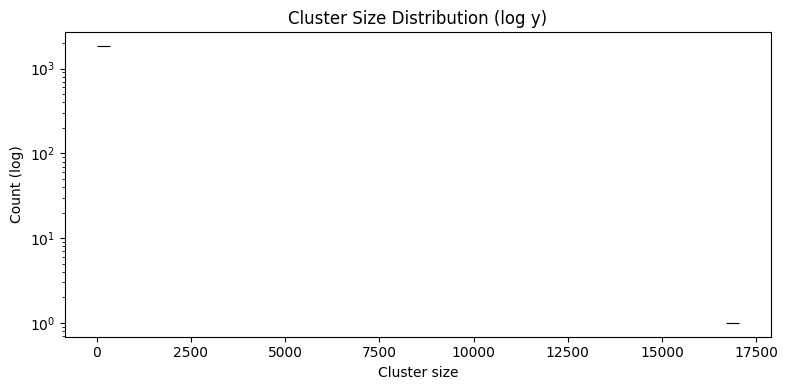

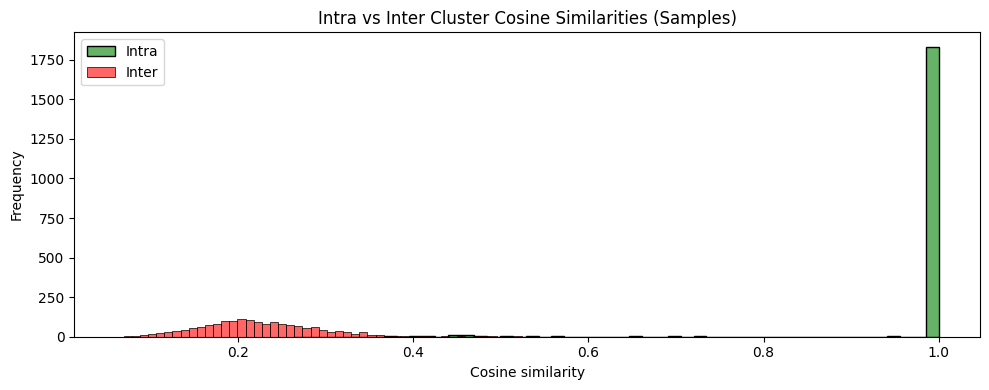


Sample cluster term summaries:


IndexError: index 18903 is out of bounds for axis 0 with size 18903

In [60]:
# Diagnostics plots: size distribution & similarity histograms
import matplotlib.pyplot as plt
import seaborn as sns

# Cluster size distribution
plt.figure(figsize=(8,4))
sns.histplot(clusters_df['size'], bins=50, log_scale=(False, True))
plt.title('Cluster Size Distribution (log y)')
plt.xlabel('Cluster size')
plt.ylabel('Count (log)')
plt.tight_layout()
plt.show()

# Similarity histograms
plt.figure(figsize=(10,4))
if len(intra_sims_all) > 0:
    sns.histplot(intra_sims_all, color='green', bins=50, alpha=0.6, label='Intra')
if len(sample_inter) > 0:
    sns.histplot(sample_inter, color='red', bins=50, alpha=0.6, label='Inter')
plt.title('Intra vs Inter Cluster Cosine Similarities (Samples)')
plt.xlabel('Cosine similarity')
plt.ylabel('Frequency')
plt.legend()
plt.tight_layout()
plt.show()

# Top terms for a few largest clusters (by similarity to centroid)
print("\nSample cluster term summaries:")
for _, row in clusters_df.head(5).iterrows():
    c_id = row['cluster_id']
    members = [m for m in points_df[points_df['cluster_id']==c_id]['term'].tolist()]
    centroid = np.array(json.loads(row['centroid_vector']))
    member_indices = [i for i in range(len(topics)) if final_membership[i]==c_id]
    sims = [float(X[i] @ centroid) for i in member_indices]
    term_sims = sorted(zip([topics.iloc[i]['term'] for i in member_indices], sims), key=lambda x: -x[1])
    top_terms = [t for t,_ in term_sims[:10]]
    print(f"Cluster {c_id} size={row['size']} medoid='{row['medoid_term']}' top_terms=" + ", ".join(top_terms))


Delete topics not relevant to 'AI development and implementation'